In [1]:
#pip install --upgrade --force-reinstall matplotlib

In [2]:
import pandas as pd
import numpy as np
import json
import re

In [3]:
import matplotlib as plt

In [4]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

#### Učitavanje podataka

In [5]:
data_attrition=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [6]:
data_attrition

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


#### Proveravanje null vrednosti u skupu podataka

In [7]:
data_attrition.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [8]:
##### Proveravamo da li nam se u skupu podataka 
maska = data_attrition.isnull() | (data_attrition == '') | (data_attrition == 'None') | (data_attrition == ' ')

In [9]:
broj_null_vrednosti = maska.sum()
print(broj_null_vrednosti)

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [10]:
### Provera duplikata je takodje jedna od tehnika koje su neophodne u generisanju i preprocesiranju modela mašinskog učenja
## Nekada se radi svesno oversemplovanje ili undersamplovanje skupa podataka za treniranje medjutim u ovom slučaju je
# bolje na početku proveriti i uveriti se da li u samom startu postoje vrednosti koje su duplirane
### 

In [11]:
podaci_duplirani= data_attrition.duplicated()

In [12]:
# SADA DA VIDIMO DA LI SU PODACI DUPLIRANI
data_attrition[podaci_duplirani]

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


In [13]:
#-Podaci u početnom skupu podataka nisu duplirani i nalaze se normalno 

In [14]:
#### Provera unique vrednosti unutar kolona 
#### kako bi izbegle i izbrisale konstantne vrednosti u skupu podataka koje nisu korisne ili su neke informacije
### poput ID kolona koji nisu kasnije relevantne za analizu

In [15]:
data_attrition.shape

(1470, 35)

In [16]:
for kolona in data_attrition.columns:
    print(f"{kolona}: Ima jedinstvenih vrednosti {data_attrition[kolona].nunique()}")
    print("######################################################")

Age: Ima jedinstvenih vrednosti 43
######################################################
Attrition: Ima jedinstvenih vrednosti 2
######################################################
BusinessTravel: Ima jedinstvenih vrednosti 3
######################################################
DailyRate: Ima jedinstvenih vrednosti 886
######################################################
Department: Ima jedinstvenih vrednosti 3
######################################################
DistanceFromHome: Ima jedinstvenih vrednosti 29
######################################################
Education: Ima jedinstvenih vrednosti 5
######################################################
EducationField: Ima jedinstvenih vrednosti 6
######################################################
EmployeeCount: Ima jedinstvenih vrednosti 1
######################################################
EmployeeNumber: Ima jedinstvenih vrednosti 1470
######################################################
EnvironmentSatisfactio

In [17]:
for kolona in data_attrition.columns:
    if data_attrition[kolona].nunique()==1:
        print(f"{kolona}: Ima jednu jedinstvenu vrednosti {data_attrition[kolona].nunique()}")
        print("######################################################")
    elif data_attrition[kolona].nunique()==data_attrition.shape[0]:
        print(f"{kolona}: Ima sve različite vrednosti")
        print("######################################################")
        

EmployeeCount: Ima jednu jedinstvenu vrednosti 1
######################################################
EmployeeNumber: Ima sve različite vrednosti
######################################################
Over18: Ima jednu jedinstvenu vrednosti 1
######################################################
StandardHours: Ima jednu jedinstvenu vrednosti 1
######################################################


In [18]:
## pre nego što ove informacije budu iskorišćene za prečišćavanje skupa podataka možemo videti raspodelu

array([[<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'DailyRate'}>,
        <Axes: title={'center': 'DistanceFromHome'}>,
        <Axes: title={'center': 'Education'}>,
        <Axes: title={'center': 'EmployeeCount'}>],
       [<Axes: title={'center': 'EmployeeNumber'}>,
        <Axes: title={'center': 'EnvironmentSatisfaction'}>,
        <Axes: title={'center': 'HourlyRate'}>,
        <Axes: title={'center': 'JobInvolvement'}>,
        <Axes: title={'center': 'JobLevel'}>],
       [<Axes: title={'center': 'JobSatisfaction'}>,
        <Axes: title={'center': 'MonthlyIncome'}>,
        <Axes: title={'center': 'MonthlyRate'}>,
        <Axes: title={'center': 'NumCompaniesWorked'}>,
        <Axes: title={'center': 'PercentSalaryHike'}>],
       [<Axes: title={'center': 'PerformanceRating'}>,
        <Axes: title={'center': 'RelationshipSatisfaction'}>,
        <Axes: title={'center': 'StandardHours'}>,
        <Axes: title={'center': 'StockOptionLevel'}>,
        <Axe

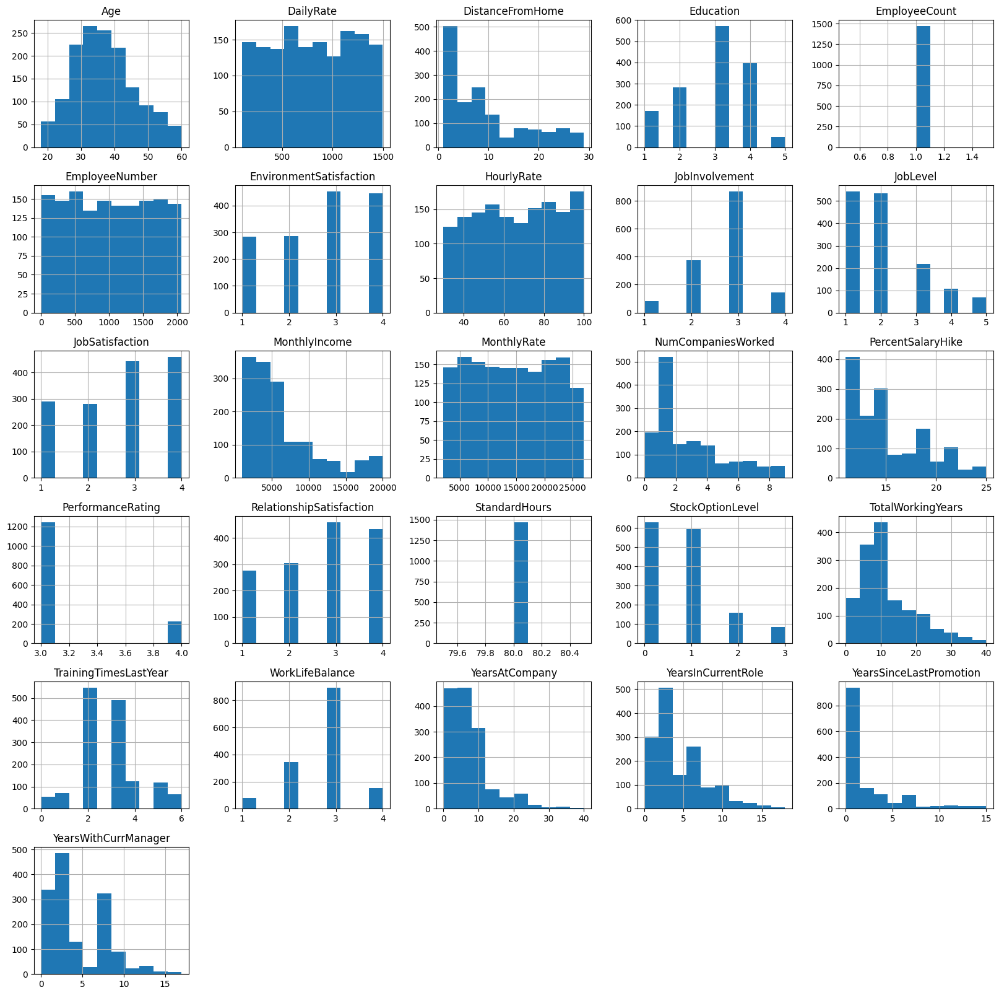

In [19]:
data_attrition.hist(figsize=(20,20))

In [20]:
# Na osnovu prikazanih histograma mogu se izneti sl. zaključci:
# - Dobra većina varijabli imaju distribuciju gde su krajevi raspodele izuzetno opterećeni,
## tako reći to su raspodele verovatnoća čiji repovi (krajevi) nisu eksponencijalno ograničeni. 
# To onda znači da oni opadaju sporije od ekponencijalne raspodele.
# u našem slučaju to bi značilo da većina varijabli ima raspodelu nakrivljenu na desno.
### Takođe vidimo da su neke varijable konstantne i da je moguće da se izbace i ne proučavaju dalje.

In [21]:
##### Ovde se zakljucuje da je neophodno ukoliti kolone koje imaju standardnu vrednost poput EmployeeCount, StandardHours Over18 a da
#varijabla EmployeeNumber predstavlja 

In [22]:
data_attrition.drop(['EmployeeCount', 'EmployeeNumber', 'Over18', 'StandardHours'], axis="columns", inplace=True                      )

In [23]:
data_attrition.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2


In [24]:
### yes - 1; no -0
label_encoder_output = LabelEncoder()
data_attrition['Attrition'] = label_encoder_output.fit_transform(data_attrition['Attrition'])

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [25]:
data_attrition.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2


In [26]:
#data_attrition.head(5).to_csv("sample21.07.csv", index=False)

In [27]:
## sledeći korak je da se odradi uklanjanje outlier-a 
# - tu mogu da se koriste dve technike sada ćemo odraditi tehniku koriščenjem Z-score-a ali posto je takav vid uklanjanja oulier-a
## preporucljiv iskljucivo sa numerickim vrednostima potrebno je da se dobro razumeju sve kolone i shodno tome da se razdvoje
#### u odgovarajuće tipove podatka

In [28]:
data_attrition.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [29]:
numeričke_varijable=['Age', 'DailyRate', 'DistanceFromHome', 'HourlyRate', 'MonthlyIncome',
                     'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'TotalWorkingYears',
                    'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 
                    'YearsSinceLastPromotion', 'YearsWithCurrManager']

In [30]:
kategoričke_nominalne=['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus']

In [31]:
izlazna_varijabla=['Attrition']

In [32]:
kategoričke_binarne=['Gender', 'OverTime']

In [33]:
kategoričke_ordinalne=['Education', 'EnvironmentSatisfaction', 'JobInvolvement', 
                       'JobLevel', 'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction',
                       'StockOptionLevel', 'WorkLifeBalance']

In [34]:
sve_kategoricke=kategoričke_nominalne+kategoričke_binarne+kategoričke_ordinalne

In [35]:
###### Ispod je predstavljena tehnika otklanjanja outlier-a na osnovu z-scorea

In [36]:
data_attrition.shape

(1470, 31)

In [37]:
###
import numpy as np
from scipy import stats

In [38]:
########## IPAK JE POTREBNO UKLONITI OUTLIER-e tehnika menjanja oulier vrednosti sa donjim ili gornjim quantilom nije bila uspesna
z_skorovi = np.abs(stats.zscore(data_attrition[numeričke_varijable]))
data_attrition_outlier_cleaned = data_attrition[(z_skorovi < 3).all(axis=1)]

In [39]:
# def winsorize_series(series, lower_quantile=0.25, upper_quantile=0.75):
#     lower_bound = series.quantile(lower_quantile)
#     upper_bound = series.quantile(upper_quantile)
#     return np.clip(series, lower_bound, upper_bound)

In [40]:
# data_attrition_winsorized = data_attrition.copy()
# for var in numeričke_varijable:
#     data_attrition_winsorized[var] = winsorize_series(data_attrition[var])

In [41]:
# print(data_attrition_winsorized[numeričke_varijable].describe())

In [42]:
#data_attrition_outlier_cleaned =data_attrition_winsorized

In [43]:
data_attrition_outlier_cleaned.shape

(1387, 31)

In [44]:
#### Sledeći korak jeste feature engineering u kome ćemo dodati odredjene izvedene varijable


In [45]:
# data_attrition_obogacen= data_attrition_outlier_cleaned.copy()

In [46]:
# data_attrition_obogacen['YearsAtCompany_ManagerRatio'] = data_attrition_obogacen['YearsAtCompany'] / (data_attrition_obogacen['YearsWithCurrManager'] + 1)
# data_attrition_obogacen['SalaryIncreasePerYear']=(data_attrition_obogacen['MonthlyIncome']-data_attrition_obogacen['DailyRate']*22) / data_attrition_obogacen['YearsAtCompany']

In [47]:
data_attrition_obogacen=data_attrition_outlier_cleaned

In [48]:
data_attrition_obogacen.shape

(1387, 31)

In [49]:
### sada se dodaju ove dve numericke varijable u numericke varijable i onda je potrebno da će biti odradjena 
##odgovarajuća konverzija kategorickih varijabli u numerickih kao i skaliranje numerickih varijabli

In [50]:
# numeričke_varijable.append('YearsAtCompany_ManagerRatio')
# numeričke_varijable.append('SalaryIncreasePerYear')

In [51]:
numeričke_varijable

['Age',
 'DailyRate',
 'DistanceFromHome',
 'HourlyRate',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

In [52]:
##### konverzija kategorickih u numericke

In [53]:
### prvo kategoricke ordinalne konvertujemo u ordinal varijable

In [54]:
import warnings

warnings.filterwarnings('ignore', category=FutureWarning)

In [55]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [56]:
from tqdm import tqdm

In [57]:
le = LabelEncoder()
l1 = []; l2 = []; text_categorical_features = []
label_encoders={}
print('Pretvaranje kategorickih varijabli ')
for i in tqdm(sve_kategoricke):
    if type(data_attrition_obogacen[i][0]) == str:
        text_categorical_features.append(i)
        data_attrition_obogacen[i] = le.fit_transform(data_attrition_obogacen[i])
        label_encoders[i]=le
        l1.append(list(data_attrition_obogacen[i].unique())); l2.append(list(le.inverse_transform(data_attrition_obogacen[i].unique())))
        print(i,' : ',data_attrition_obogacen[i].unique(),' = ',le.inverse_transform(data_attrition_obogacen[i].unique()))

Pretvaranje kategorickih varijabli 


  0%|          | 0/16 [00:00<?, ?it/s]C:\Users\andjelami\AppData\Local\Temp\ipykernel_44560\4062063604.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_attrition_obogacen[i] = le.fit_transform(data_attrition_obogacen[i])
C:\Users\andjelami\AppData\Local\Temp\ipykernel_44560\4062063604.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_attrition_obogacen[i] = le.fit_transform(data_attrition_obogacen[i])
C:\Users\andjelami\AppData\Local\Temp\ipykernel_44560\4062063604.py:8: SettingWithCopyWarnin

BusinessTravel  :  [2 1 0]  =  ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
Department  :  [2 1 0]  =  ['Sales' 'Research & Development' 'Human Resources']
EducationField  :  [1 4 3 2 5 0]  =  ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
JobRole  :  [7 6 2 4 0 3 8 5 1]  =  ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']
MaritalStatus  :  [2 1 0]  =  ['Single' 'Married' 'Divorced']
Gender  :  [0 1]  =  ['Female' 'Male']
OverTime  :  [1 0]  =  ['Yes' 'No']


In [58]:
# tf1 = {}
# for i in range(len(text_categorical_features)):
#     tf1[text_categorical_features[i]] = {}
#     for j,k in zip(l1[i],l2[i]):
#         tf1[text_categorical_features[i]][j] = k

In [59]:
# label_encoders = {}
# for kolona in kategoričke_ordinalne:
#     le = LabelEncoder()
#     data_attrition_obogacen[kolona] = le.fit_transform(data_attrition_obogacen[kolona])
#     label_encoders[kolona] = le

In [60]:
# data_attrition_obogacen = pd.get_dummies(data_attrition_obogacen, columns= kategoričke_nominalne + kategoričke_binarne, drop_first=True)

In [61]:
#### Sada se koristi Standard Scaler za skaliranje numerickih varijabli

In [62]:
# ###3 ! ovo je zbog izvedenih varijabli 
# data_attrition_obogacen.replace([np.inf, -np.inf], np.nan, inplace=True)
# data_attrition_obogacen.dropna(inplace=True)

In [63]:
# data_attrition_obogacen.shape

In [64]:
data_attrition_obogacen.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [65]:
data_attrition_obogacen.to_excel("data_attrition_obogacen.xlsx")

In [66]:
################## final kolone

In [67]:
data_attrition_obogacen.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,2,0,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,3,1,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,1,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,4,0,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,1,...,3,4,1,6,3,3,2,2,2,2


In [68]:
data_attrition_obogacen.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1387 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   Age                       1387 non-null   int64
 1   Attrition                 1387 non-null   int32
 2   BusinessTravel            1387 non-null   int32
 3   DailyRate                 1387 non-null   int64
 4   Department                1387 non-null   int32
 5   DistanceFromHome          1387 non-null   int64
 6   Education                 1387 non-null   int64
 7   EducationField            1387 non-null   int32
 8   EnvironmentSatisfaction   1387 non-null   int64
 9   Gender                    1387 non-null   int32
 10  HourlyRate                1387 non-null   int64
 11  JobInvolvement            1387 non-null   int64
 12  JobLevel                  1387 non-null   int64
 13  JobRole                   1387 non-null   int32
 14  JobSatisfaction           1387 non-null   int

In [69]:
import imblearn
from imblearn.pipeline import Pipeline
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

In [70]:
kolone_ulazne= list(data_attrition_obogacen.columns)
kolone_ulazne.remove('Attrition')

In [71]:
f1 = data_attrition_obogacen.loc[:, kolone_ulazne]
t1 = data_attrition_obogacen.loc[:, 'Attrition']

In [72]:
from sklearn.model_selection import train_test_split

In [73]:
x_train, x_test, y_train, y_test = train_test_split(f1, t1, test_size=0.2, random_state=2)


In [74]:
over = SMOTE(sampling_strategy=0.85)

In [75]:
steps = [('over', over)]

In [76]:
pipeline = Pipeline(steps=steps)


In [77]:
x_train

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1337,28,2,1172,2,3,3,3,2,0,78,...,3,4,1,1,3,3,1,0,0,0
1389,31,1,1125,1,1,3,1,4,1,48,...,4,2,0,10,6,3,10,8,8,7
1103,48,2,492,2,16,4,1,3,0,96,...,3,3,1,18,2,3,8,7,7,7
533,40,1,580,2,5,4,1,4,1,48,...,4,3,1,20,2,3,18,13,1,12
777,21,2,1334,1,10,3,1,3,0,36,...,3,1,0,1,6,2,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,27,2,1420,2,2,1,2,3,1,85,...,3,2,1,5,3,3,4,3,0,2
318,27,2,1220,1,5,3,1,3,0,85,...,3,2,0,4,2,2,4,3,1,2
522,37,2,1225,1,10,2,1,4,1,80,...,3,1,0,4,2,3,1,0,0,0
557,35,0,1225,1,2,4,1,4,0,61,...,3,1,1,16,2,4,1,0,0,0


In [78]:
x_train_balansiran, y_train_balansiran = pipeline.fit_resample(x_train, y_train)

In [79]:
x_train = x_train_balansiran
y_train = y_train_balansiran

In [80]:
# from sklearn.model_selection import train_test_split

# x_train, x_test, y_train, y_test = train_test_split(f1, t1, test_size = 0.15, random_state = 2)

In [81]:
x_train_test = x_train.copy(deep = True)
x_train_test['Attrition'] = y_train

In [82]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif,chi2

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns


In [84]:
colors = ['#D8BFD8', '#FFFFFF']

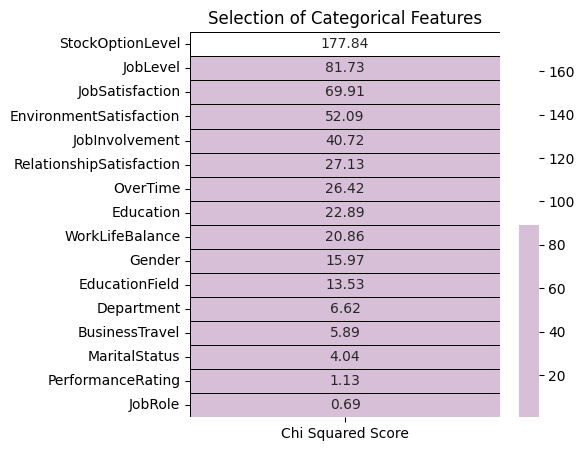

In [85]:
features = x_train.loc[:,sve_kategoricke]
target = pd.DataFrame(y_train)

best_features = SelectKBest(score_func = chi2,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['Chi Squared Score']) 

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'Chi Squared Score'),annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Categorical Features');

In [86]:
#### iz ovoga se vidi da je potrebno da se ukolone 
## Gender, EducationField, BusinessTravel, JobRole, Department,MaritalStatus, PerformanceRating


In [87]:
from sklearn.feature_selection import SelectKBest, f_classif

In [88]:
features = x_train[numeričke_varijable]
target = pd.DataFrame(y_train)

In [89]:
best_features = SelectKBest(score_func=f_classif, k='all')
fit = best_features.fit(features, target)

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [90]:
feature_scores = pd.DataFrame({
    'Feature': features.columns,
    'ANOVA Score': fit.scores_
})

In [91]:
sorted_feature_scores = feature_scores.sort_values(by='ANOVA Score', ascending=False)

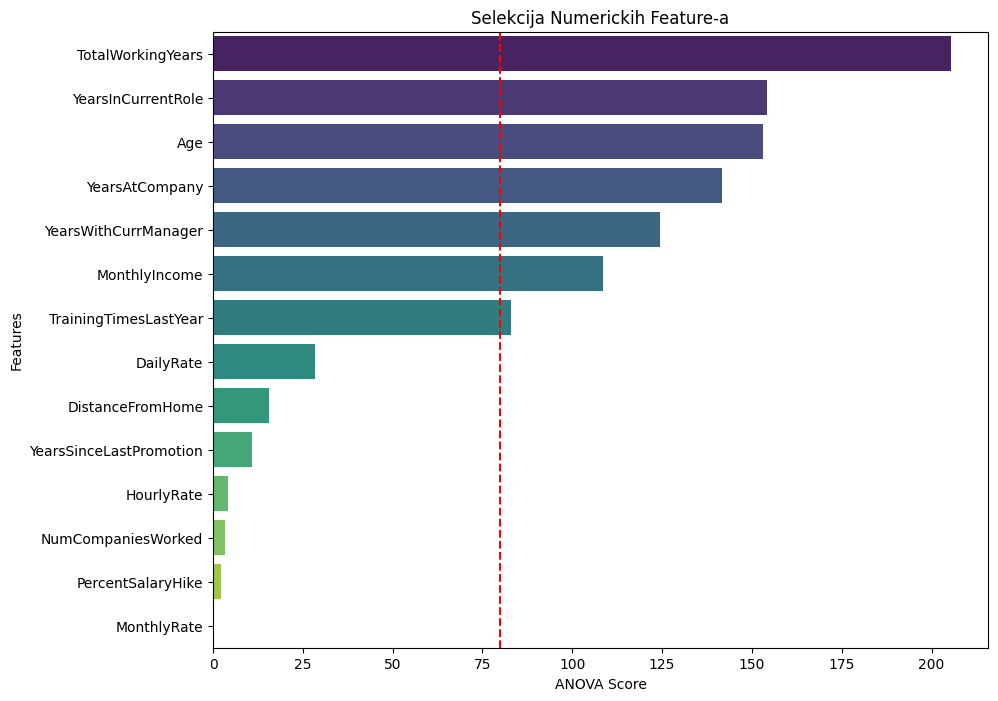

In [92]:
plt.figure(figsize=(10, 8))
sns.barplot(x='ANOVA Score', y='Feature', data=sorted_feature_scores, palette='viridis')
plt.axvline(x=80, color='red', linestyle='--')
plt.title('Selekcija Numerickih Feature-a')
plt.xlabel('ANOVA Score')
plt.ylabel('Features')
plt.show()

In [93]:
#### ovde na osnovu ANOVA testa mozemo da vidimo da od numerickih varijabli bilo bi dobro da izbacimo 
### YearsSinceLastPromation, DailyRate, DistanceFromHome, PercentSalaryHike, 
# MonthlyRate, HourlyRate, NumCompaniesWorked



In [94]:
x_train = x_train.drop(columns = ['MonthlyRate', 'HourlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 
                                  'YearsSinceLastPromotion', 'DistanceFromHome','DailyRate',
                                  'PerformanceRating', 'Department', 'JobRole', 'EducationField', 
                                  'BusinessTravel', 'MaritalStatus' ,'Gender'])

x_test = x_test.drop(columns = ['MonthlyRate', 'HourlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 
                                  'YearsSinceLastPromotion', 'DistanceFromHome','DailyRate',
                                  'PerformanceRating', 'Department', 'JobRole', 'EducationField', 
                                  'BusinessTravel', 'MaritalStatus' ,'Gender'])

In [95]:
x_train

,Age,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,OverTime,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager
0,28,3,2,3,1,2,2856,0,4,1,1,3,3,1,0,0
1,31,3,4,1,2,1,5003,0,2,0,10,6,3,10,8,7
2,48,4,3,3,2,3,6439,0,3,1,18,2,3,8,7,7
3,40,4,4,2,3,1,10475,1,3,1,20,2,3,18,13,12
4,21,3,3,2,1,1,1416,0,1,0,1,6,2,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1706,34,3,1,2,1,3,2581,0,3,0,3,0,3,1,1,1
1707,29,3,2,2,2,2,7315,0,3,1,9,3,2,8,3,6
1708,30,3,3,2,1,1,2313,0,1,0,4,2,3,4,2,2
1709,35,3,4,3,1,2,2561,1,3,0,9,2,1,6,5,5


In [96]:
############### NACIN skaliranja varijabli prvo cemo uraditi normalizaciju

In [97]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler

In [98]:
min_max_scaler = MinMaxScaler()

In [99]:
standard_scaler = StandardScaler()

In [100]:
kolone_za_normalizaciju = ['MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager']

In [101]:
kolone_za_standardizaciju = ['Age', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'OverTime', 'RelationshipSatisfaction', 'StockOptionLevel', 'TrainingTimesLastYear', 'WorkLifeBalance']

In [102]:
standard_scalers = {}
min_max_scalers = {}

In [103]:
for col in kolone_za_standardizaciju:
    x_train[col] = standard_scaler.fit_transform(x_train[[col]])
    x_test[col] = standard_scaler.transform(x_test[[col]])
    standard_scalers[col] = standard_scaler

In [104]:
for col in kolone_za_normalizaciju:
    x_train[col] = min_max_scaler.fit_transform(x_train[[col]])
    x_test[col] = min_max_scaler.transform(x_test[[col]])
    min_max_scalers[col] = min_max_scaler

### MODELIRANJE

In [105]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc



In [106]:
##### Posto ce se koristiti mnogi modeli kako se kod ne bi preklapao postojace funkcije koje rade 
# izggradnju modela prikaz kros validacijskog scora i prikaz evaluacionih metrika

In [107]:
import matplotlib.pyplot as plt

In [108]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score, roc_curve, precision_score, recall_score, f1_score, precision_recall_curve

In [109]:
boje_za_grafikone= ['#8A2BE2','#D02090']

#### Modelovanje bez hiperparametrizacije

In [110]:
def prikazivanje_roc_auc_krive(model, x_test, y_test, y_pred_proba):
    #y_prob = model.predict_proba(x_test)[:,1]

    FPR,TPR, thresholds = roc_curve(y_test, y_pred_proba)

    roc_auc = auc(FPR,TPR)
    plt.figure()
    plt.plot(FPR, TPR, color='purple', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='violet', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC kriva')
    plt.legend(loc="lower right")
    plt.show()

In [111]:
def krosvalidacija_i_prikaz_roc_auc_krive(model, x_train, y_train, x_test, y_test, y_pred, y_pred_proba):
    ##### Krosvalidacija i pracenje krosvalidacionog score-a
    cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats=3, random_state=1)
    kros_validacioni_score=cross_val_score(model,x_train,y_train,cv = cv,scoring = 'roc_auc').mean()
    print("Krosvalidacioni scopre: ",'{0:.2%}'.format(cross_val_score(model,x_train,y_train,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(y_test,y_pred)))

    ############### SADA SE PRINTA ROC_AUC KRIVA
    prikazivanje_roc_auc_krive (model, x_test, y_test, y_pred_proba)
    return kros_validacioni_score

In [112]:
def evaluacija_modela_metrike(ime_modela,y_test, y_pred, y_pred_prob):

    print("#################################")
    accuracy=accuracy_score(y_test, y_pred)
    print(f"Accuracy (Tačnost): {accuracy_score(y_test, y_pred)}")
    print("#################################")
    precision_= precision_score(y_test, y_pred)
    print(f"Precision (Preciznost): {precision_score(y_test, y_pred)}")
    print("#################################")
    recall_ = recall_score(y_test, y_pred)
    print(f"Recall(odziv): {recall_score(y_test, y_pred)}")
    print("###############################")
    f1_score_=f1_score(y_test, y_pred)
    print(f"F1 Score: {f1_score(y_test, y_pred)}")
    roc_auc_score_=roc_auc_score(y_test, y_pred_prob)
    print(f"ROC AUC: {roc_auc_score(y_test, y_pred_prob)}")
    print(f"Confusion Matrix (matrica konfuzije):\n{confusion_matrix(y_test, y_pred)}")
    print(f"Classification Report (klasifikacijski izvestaj):\n{classification_report(y_test, y_pred)}\n")

    ###### printing the confusion matrix
    plt.figure(figsize=(4, 4))
    matrica_konfuzije= confusion_matrix(y_test, y_pred)
    falseNegativi=matrica_konfuzije[1,0]
    ## IZMENJENA MATRICA RADI INTUITIVNIJEG PRIKAZA
    konvertovana_matrica = np.fliplr(np.flipud(matrica_konfuzije))
    
    sns.heatmap(konvertovana_matrica, annot=True, fmt='d', cmap=boje_za_grafikone, xticklabels=['Attrition', 'No Attrition'], yticklabels=['Attrition', 'No Attrition'])
    plt.xlabel('Predvidjena')
    plt.ylabel('Stvarna')
    plt.title(f'Matrica konfuzuje za model {ime_modela}')
    plt.show()
    
    ##### izvestaj klasifikacije 
    print(classification_report(y_test,y_pred))

    precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
    plt.figure(figsize=(6, 4))
    plt.plot(recall, precision, label=f' Grafik za model{ime_modela}',  color='violet')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall kriva za  {ime_modela}')
    plt.legend()
    plt.show()
    return accuracy, precision_, recall_,f1_score_,roc_auc_score_,falseNegativi

    

In [113]:
def prikaz_znacajnosti_atributa(model, model_name, feature_names):
    if hasattr(model, 'feature_importances_'):
        importance = model.feature_importances_
        sorted_idx = np.argsort(importance)
        plt.figure(figsize=(10, 8))
        plt.barh(range(len(sorted_idx)), importance[sorted_idx], color=boje_za_grafikone[0], align='center')
        plt.yticks(range(len(sorted_idx)), np.array(feature_names)[sorted_idx])
        plt.xlabel('Znacajni atributi')
        plt.title(f'Znacajni atributi za {model_name}')
        plt.show()
        ###############################
        top_tri_aributa = np.array(feature_names)[sorted_idx][:3]
        return top_tri_aributa.tolist()
    elif hasattr(model, 'coef_'):
        importance = model.coef_[0]
        sorted_idx = np.argsort(importance)
        plt.figure(figsize=(10, 8))
        plt.barh(range(len(sorted_idx)), importance[sorted_idx], color=boje_za_grafikone[1], align='center')
        plt.yticks(range(len(sorted_idx)), np.array(feature_names)[sorted_idx])
        plt.xlabel('Znacajni atributi')
        plt.title(f'Znacajni atributi za {model_name}')
        plt.show()
        top_tri_aributa = np.array(feature_names)[sorted_idx][:3]
        return top_tri_aributa.tolist()
    else:
        print("Model nema podržanu značajnost attributa")
        return []

In [114]:
#########################
REZULTATI_TABELA = pd.DataFrame(columns=["Ime modela","Accuracy", "Precision", "Recall", "F1-score", "ROC_AUC_SCORE", "KrosvalidacioniScore", "FALSE NEGATIVI", "HIPERPARAMETRIZACIJA", "NAJBOLJI PARAMETRI","NAJZNACAJNIJI ATRIBUTI"])
#REZULTATI_TABELA = {}
feature_names = x_train.columns

#### Model logisticke regresije

In [115]:
from sklearn.linear_model import LogisticRegression

########### MODEL LOGISTICKE REGRESIJE ###########
Krosvalidacioni scopre:  88.90%
ROC_AUC Score :  66.50%


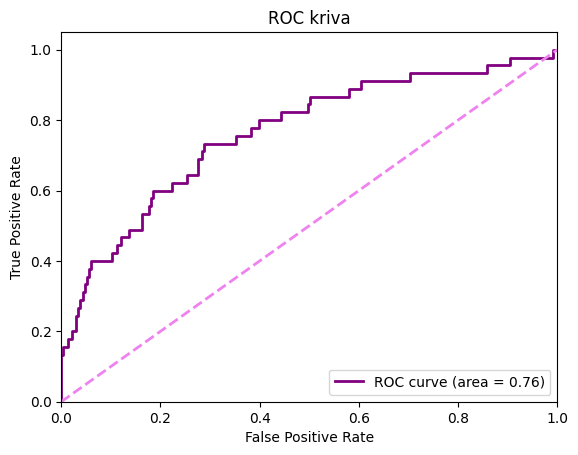

#################################
Accuracy (Tačnost): 0.7841726618705036
#################################
Precision (Preciznost): 0.3728813559322034
#################################
Recall(odziv): 0.4888888888888889
###############################
F1 Score: 0.42307692307692313
ROC AUC: 0.7648068669527897
Confusion Matrix (matrica konfuzije):
[[196  37]
 [ 23  22]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.84      0.87       233
           1       0.37      0.49      0.42        45

    accuracy                           0.78       278
   macro avg       0.63      0.67      0.65       278
weighted avg       0.81      0.78      0.80       278




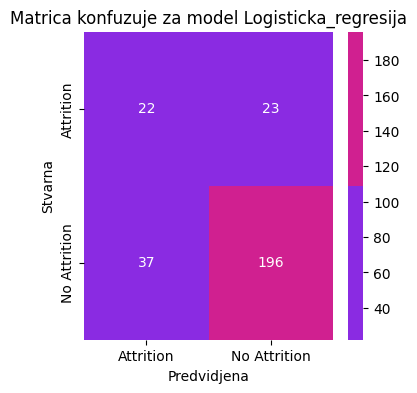

              precision    recall  f1-score   support

           0       0.89      0.84      0.87       233
           1       0.37      0.49      0.42        45

    accuracy                           0.78       278
   macro avg       0.63      0.67      0.65       278
weighted avg       0.81      0.78      0.80       278



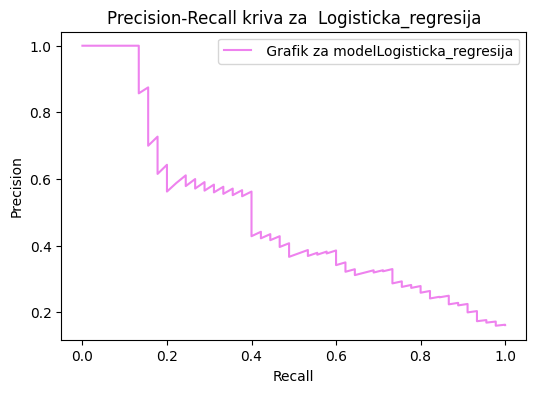

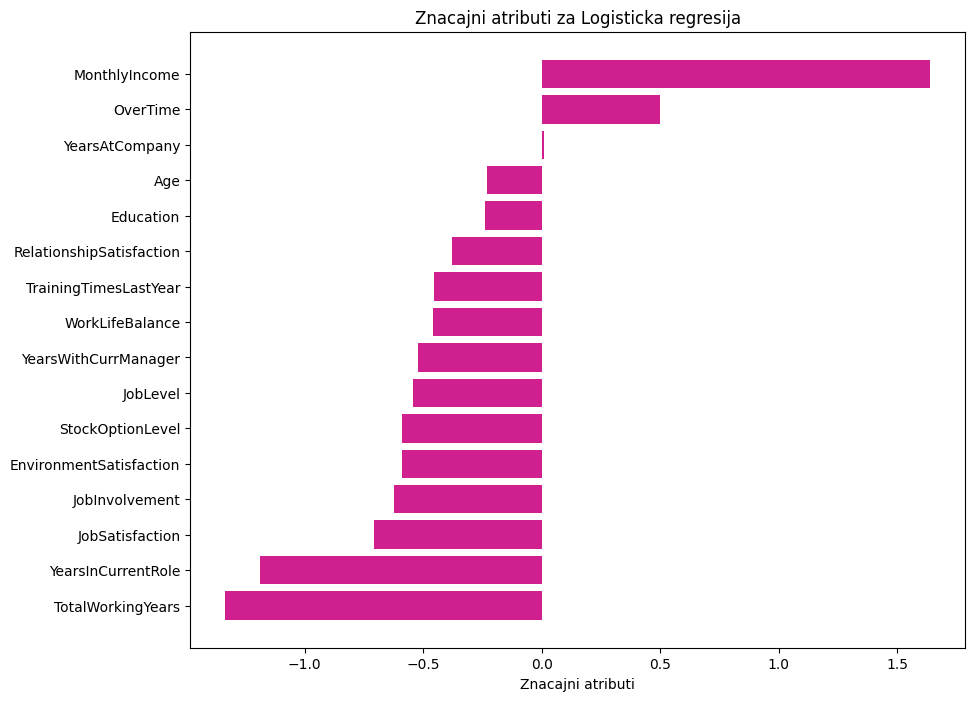

In [116]:
model_lr = LogisticRegression()
model_lr.fit(x_train, y_train)
y_pred_lr = model_lr.predict(x_test)
y_pred_prob_lr = model_lr.predict_proba(x_test)[:, 1]
print("########### MODEL LOGISTICKE REGRESIJE ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_lr, x_train,y_train,x_test, y_test,y_pred_lr, y_pred_prob_lr)
accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Logisticka_regresija", y_test,y_pred_lr, y_pred_prob_lr)

lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_lr, "Logisticka regresija", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Logisticka regresija",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [117]:
from sklearn.tree import DecisionTreeClassifier

########### MODEL Drvo odlucivanja ###########
Krosvalidacioni scopre:  80.57%
ROC_AUC Score :  59.23%


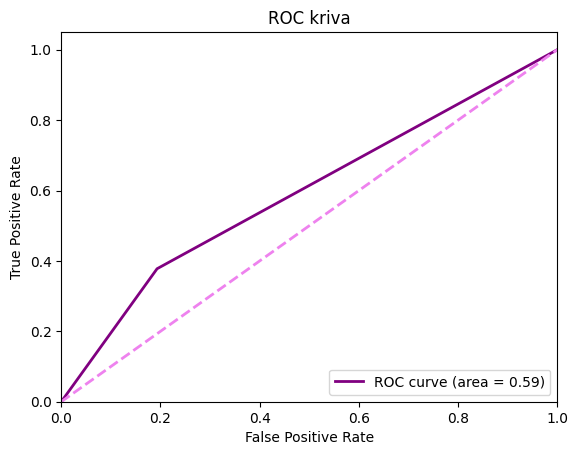

#################################
Accuracy (Tačnost): 0.737410071942446
#################################
Precision (Preciznost): 0.27419354838709675
#################################
Recall(odziv): 0.37777777777777777
###############################
F1 Score: 0.3177570093457944
ROC AUC: 0.5923223652837386
Confusion Matrix (matrica konfuzije):
[[188  45]
 [ 28  17]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.87      0.81      0.84       233
           1       0.27      0.38      0.32        45

    accuracy                           0.74       278
   macro avg       0.57      0.59      0.58       278
weighted avg       0.77      0.74      0.75       278




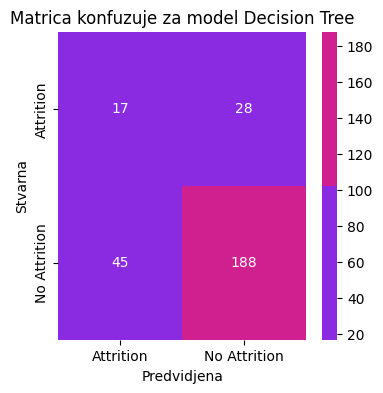

              precision    recall  f1-score   support

           0       0.87      0.81      0.84       233
           1       0.27      0.38      0.32        45

    accuracy                           0.74       278
   macro avg       0.57      0.59      0.58       278
weighted avg       0.77      0.74      0.75       278



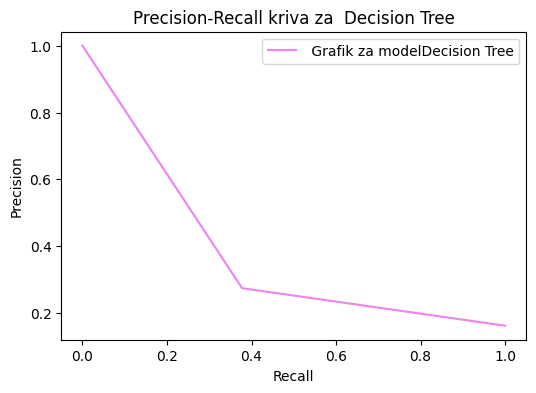

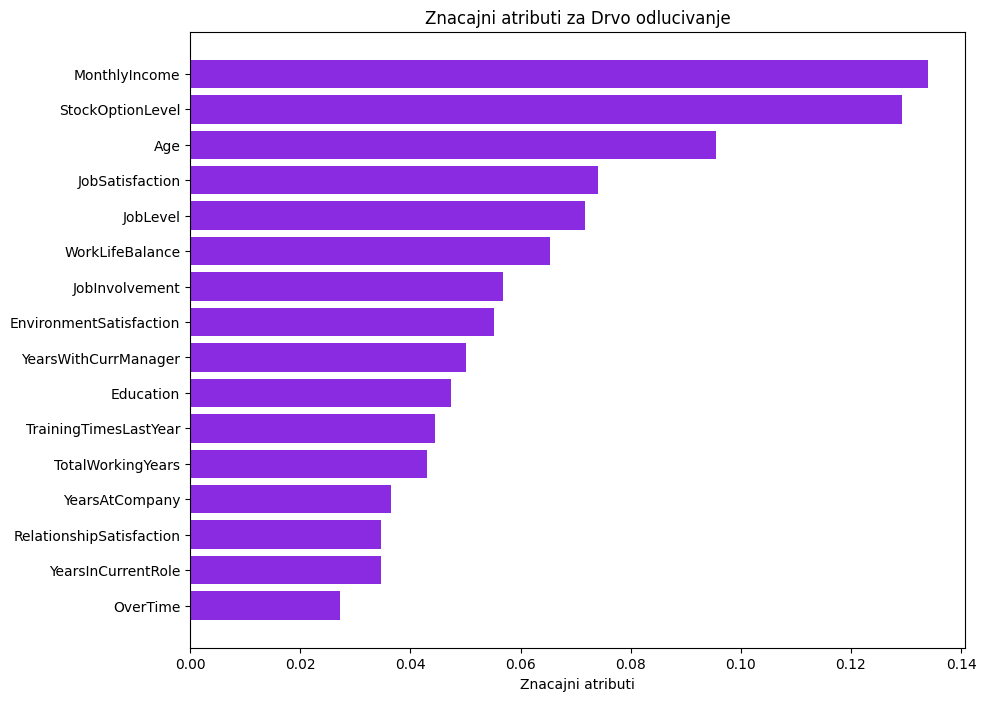

In [118]:
model_dt = DecisionTreeClassifier()
model_dt.fit(x_train, y_train)
y_pred_dt = model_dt.predict(x_test)
y_pred_prob_dt = model_dt.predict_proba(x_test)[:, 1]

print("########### MODEL Drvo odlucivanja ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_dt, x_train,y_train,x_test, y_test,y_pred_dt, y_pred_prob_dt)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Decision Tree", y_test,y_pred_dt, y_pred_prob_dt)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_dt, "Drvo odlucivanje", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Drvo odlucivanja",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [119]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier


########### MODEL Random Forest###########
Krosvalidacioni scopre:  94.65%
ROC_AUC Score :  68.97%


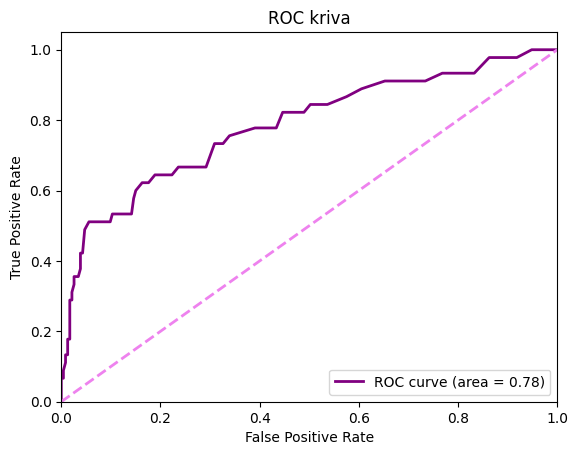

#################################
Accuracy (Tačnost): 0.8705035971223022
#################################
Precision (Preciznost): 0.6551724137931034
#################################
Recall(odziv): 0.4222222222222222
###############################
F1 Score: 0.5135135135135135
ROC AUC: 0.7836432999523129
Confusion Matrix (matrica konfuzije):
[[223  10]
 [ 26  19]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       233
           1       0.66      0.42      0.51        45

    accuracy                           0.87       278
   macro avg       0.78      0.69      0.72       278
weighted avg       0.86      0.87      0.86       278




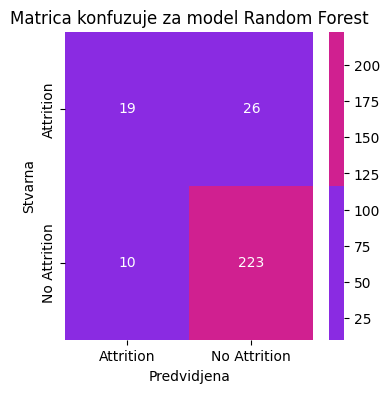

              precision    recall  f1-score   support

           0       0.90      0.96      0.93       233
           1       0.66      0.42      0.51        45

    accuracy                           0.87       278
   macro avg       0.78      0.69      0.72       278
weighted avg       0.86      0.87      0.86       278



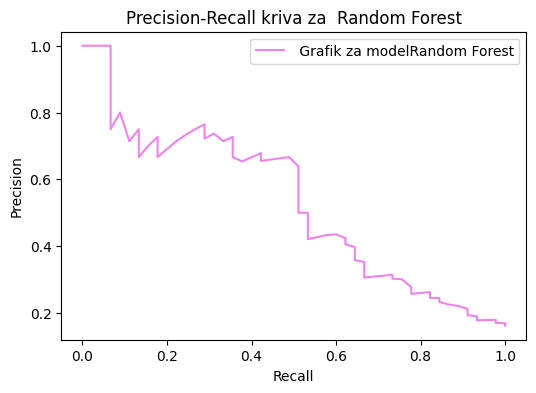

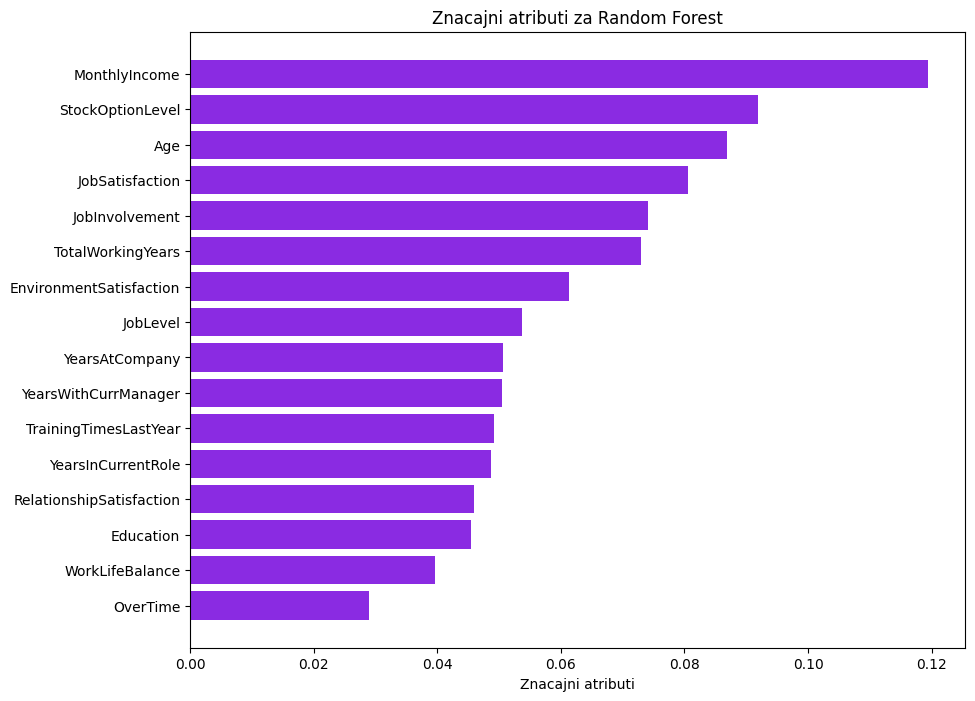

In [120]:
model_rf = RandomForestClassifier()
model_rf.fit(x_train, y_train)
y_pred_rf = model_rf.predict(x_test)
y_pred_prob_rf = model_rf.predict_proba(x_test)[:, 1]

print("########### MODEL Random Forest###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_rf, x_train,y_train,x_test, y_test,y_pred_rf, y_pred_prob_rf)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Random Forest", y_test,y_pred_rf, y_pred_prob_rf)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_rf, "Random Forest", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Random Forest",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

########### MODEL Gradient Boosting Classifier ###########
Krosvalidacioni scopre:  92.60%
ROC_AUC Score :  68.40%


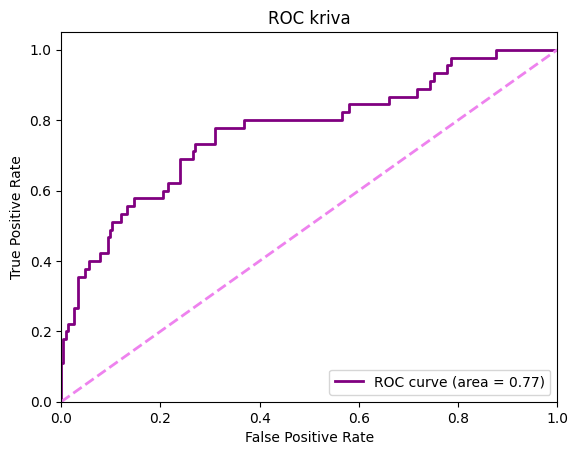

#################################
Accuracy (Tačnost): 0.8309352517985612
#################################
Precision (Preciznost): 0.4772727272727273
#################################
Recall(odziv): 0.4666666666666667
###############################
F1 Score: 0.4719101123595506
ROC AUC: 0.770815450643777
Confusion Matrix (matrica konfuzije):
[[210  23]
 [ 24  21]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       233
           1       0.48      0.47      0.47        45

    accuracy                           0.83       278
   macro avg       0.69      0.68      0.69       278
weighted avg       0.83      0.83      0.83       278




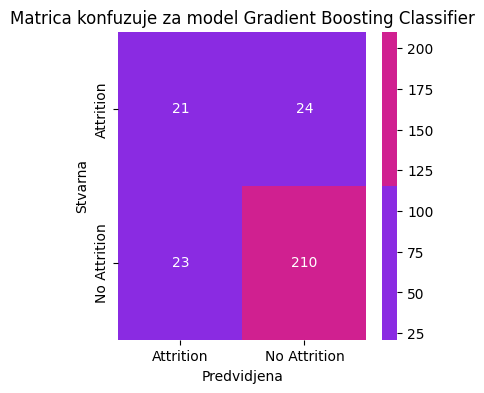

              precision    recall  f1-score   support

           0       0.90      0.90      0.90       233
           1       0.48      0.47      0.47        45

    accuracy                           0.83       278
   macro avg       0.69      0.68      0.69       278
weighted avg       0.83      0.83      0.83       278



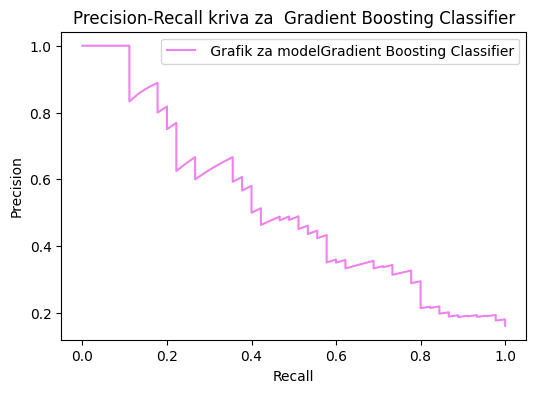

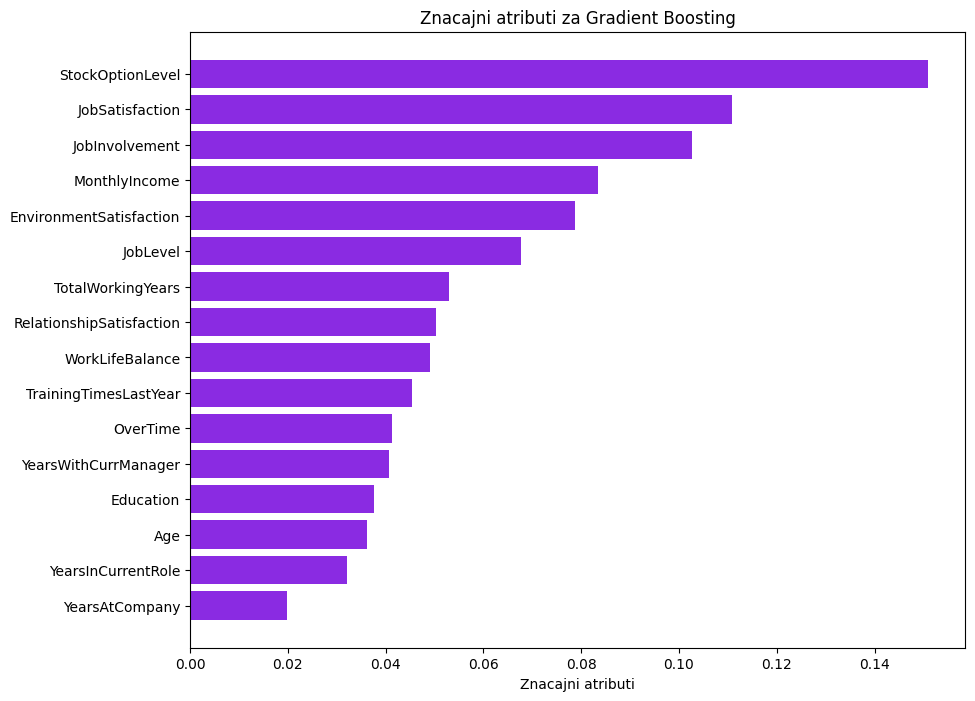

In [121]:
model_gb = GradientBoostingClassifier()
model_gb.fit(x_train, y_train)
y_pred_gb = model_gb.predict(x_test)
y_pred_prob_gb = model_gb.predict_proba(x_test)[:, 1]

print("########### MODEL Gradient Boosting Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_gb, x_train,y_train,x_test, y_test,y_pred_gb, y_pred_prob_gb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Gradient Boosting Classifier", y_test,y_pred_gb, y_pred_prob_gb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_gb, "Gradient Boosting", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Gradient Boosting",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

########### MODEL Ada Boost Classifier ###########
Krosvalidacioni scopre:  90.79%
ROC_AUC Score :  64.93%


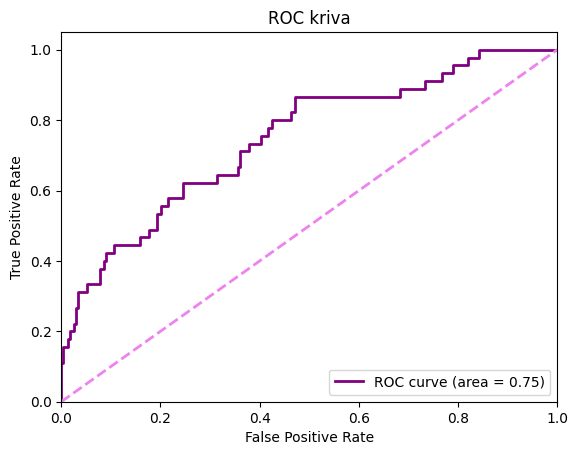

#################################
Accuracy (Tačnost): 0.7877697841726619
#################################
Precision (Preciznost): 0.37037037037037035
#################################
Recall(odziv): 0.4444444444444444
###############################
F1 Score: 0.404040404040404
ROC AUC: 0.747448736289938
Confusion Matrix (matrica konfuzije):
[[199  34]
 [ 25  20]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.85      0.87       233
           1       0.37      0.44      0.40        45

    accuracy                           0.79       278
   macro avg       0.63      0.65      0.64       278
weighted avg       0.80      0.79      0.80       278




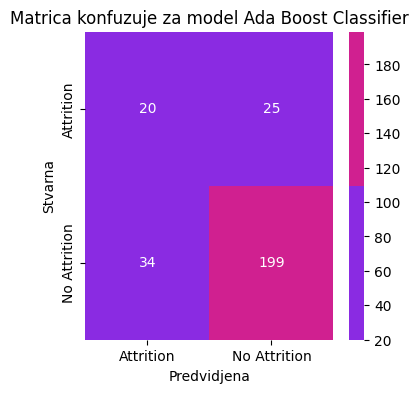

              precision    recall  f1-score   support

           0       0.89      0.85      0.87       233
           1       0.37      0.44      0.40        45

    accuracy                           0.79       278
   macro avg       0.63      0.65      0.64       278
weighted avg       0.80      0.79      0.80       278



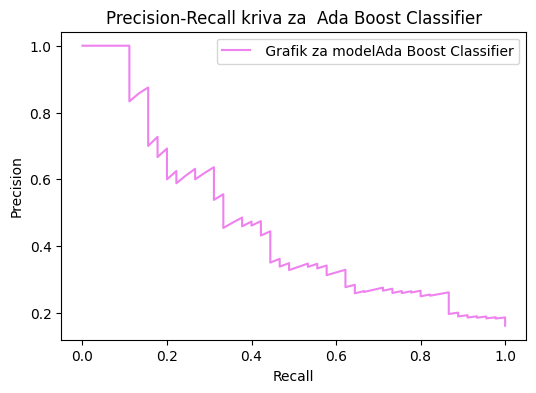

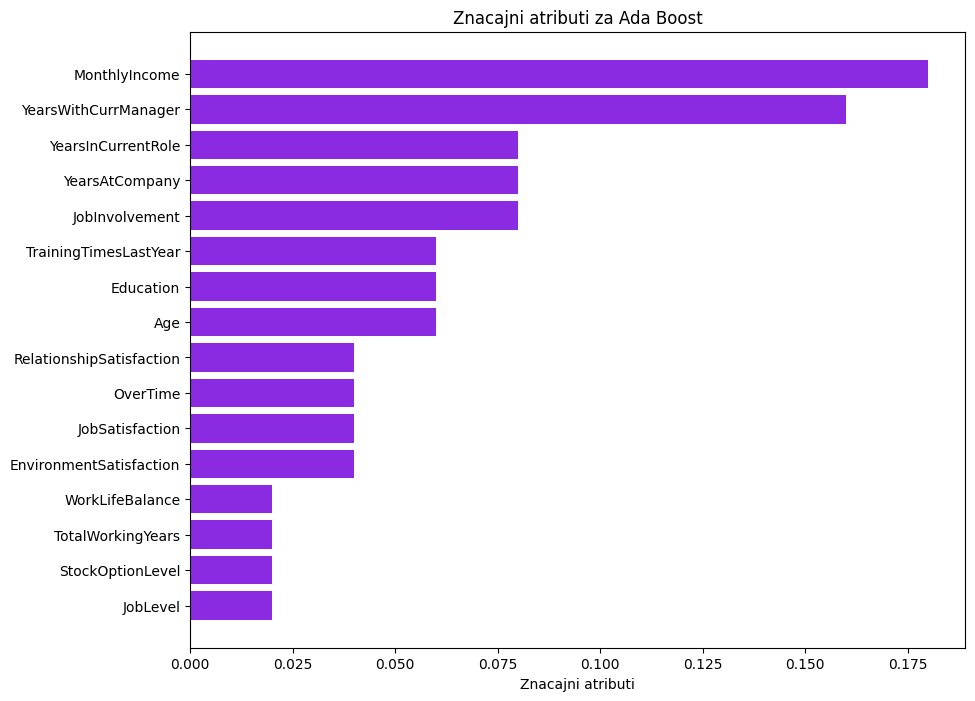

In [122]:
model_ab = AdaBoostClassifier()
model_ab.fit(x_train, y_train)
y_pred_ab = model_ab.predict(x_test)
y_pred_prob_ab = model_ab.predict_proba(x_test)[:, 1]

print("########### MODEL Ada Boost Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_ab, x_train,y_train,x_test, y_test,y_pred_ab, y_pred_prob_ab)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Ada Boost Classifier", y_test,y_pred_ab, y_pred_prob_ab)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_ab, "Ada Boost", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Ada Boost",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

########### MODEL Bagging Classifier ###########
Krosvalidacioni scopre:  92.19%
ROC_AUC Score :  60.37%


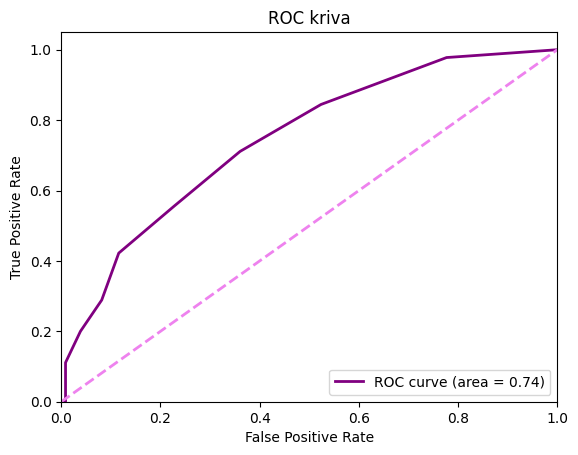

#################################
Accuracy (Tačnost): 0.8165467625899281
#################################
Precision (Preciznost): 0.40625
#################################
Recall(odziv): 0.28888888888888886
###############################
F1 Score: 0.3376623376623376
ROC AUC: 0.7444444444444445
Confusion Matrix (matrica konfuzije):
[[214  19]
 [ 32  13]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.87      0.92      0.89       233
           1       0.41      0.29      0.34        45

    accuracy                           0.82       278
   macro avg       0.64      0.60      0.62       278
weighted avg       0.79      0.82      0.80       278




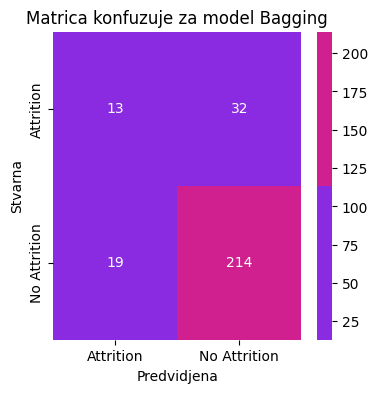

              precision    recall  f1-score   support

           0       0.87      0.92      0.89       233
           1       0.41      0.29      0.34        45

    accuracy                           0.82       278
   macro avg       0.64      0.60      0.62       278
weighted avg       0.79      0.82      0.80       278



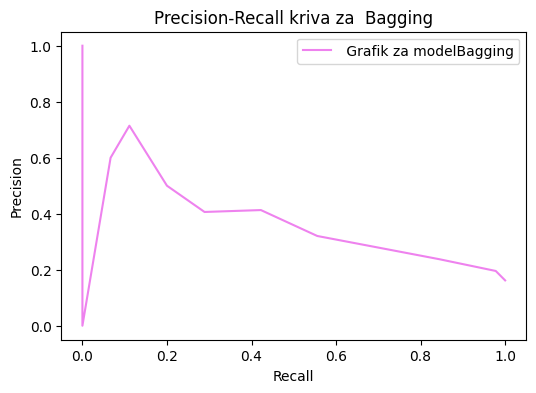

Model nema podržanu značajnost attributa


In [123]:
model_bg = BaggingClassifier()
model_bg.fit(x_train, y_train)
y_pred_bg = model_bg.predict(x_test)
y_pred_prob_bg = model_bg.predict_proba(x_test)[:, 1]

print("########### MODEL Bagging Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_bg, x_train,y_train,x_test, y_test,y_pred_bg, y_pred_prob_bg)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Bagging", y_test,y_pred_bg, y_pred_prob_bg)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_bg, "Bagging Classifier", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Bagging",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [124]:
import xgboost as xgb
import lightgbm as lgb
import catboost as cb

########### MODEL XGB Classifier###########
Krosvalidacioni scopre:  94.05%
ROC_AUC Score :  69.47%


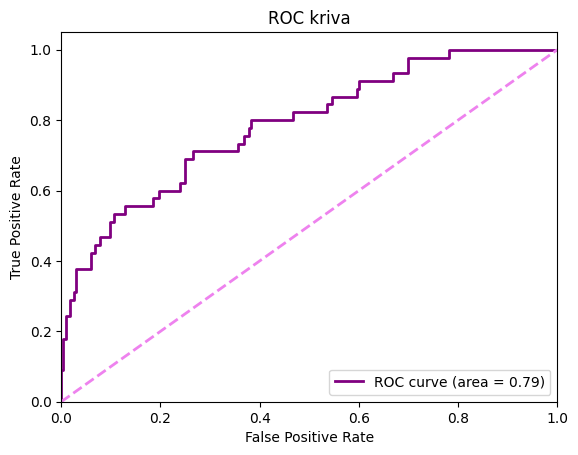

#################################
Accuracy (Tačnost): 0.8489208633093526
#################################
Precision (Preciznost): 0.5384615384615384
#################################
Recall(odziv): 0.4666666666666667
###############################
F1 Score: 0.5
ROC AUC: 0.7864568431092036
Confusion Matrix (matrica konfuzije):
[[215  18]
 [ 24  21]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.92      0.91       233
           1       0.54      0.47      0.50        45

    accuracy                           0.85       278
   macro avg       0.72      0.69      0.71       278
weighted avg       0.84      0.85      0.84       278




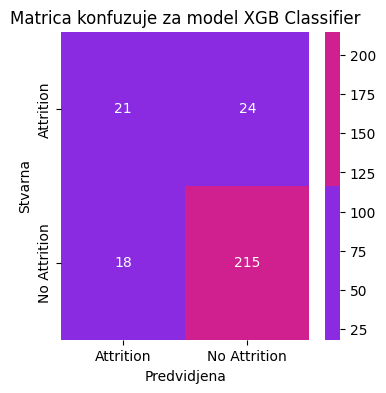

              precision    recall  f1-score   support

           0       0.90      0.92      0.91       233
           1       0.54      0.47      0.50        45

    accuracy                           0.85       278
   macro avg       0.72      0.69      0.71       278
weighted avg       0.84      0.85      0.84       278



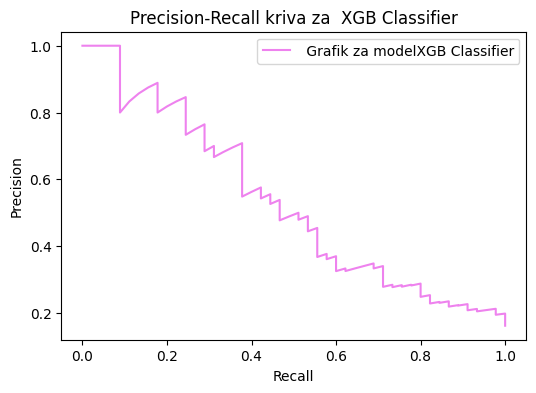

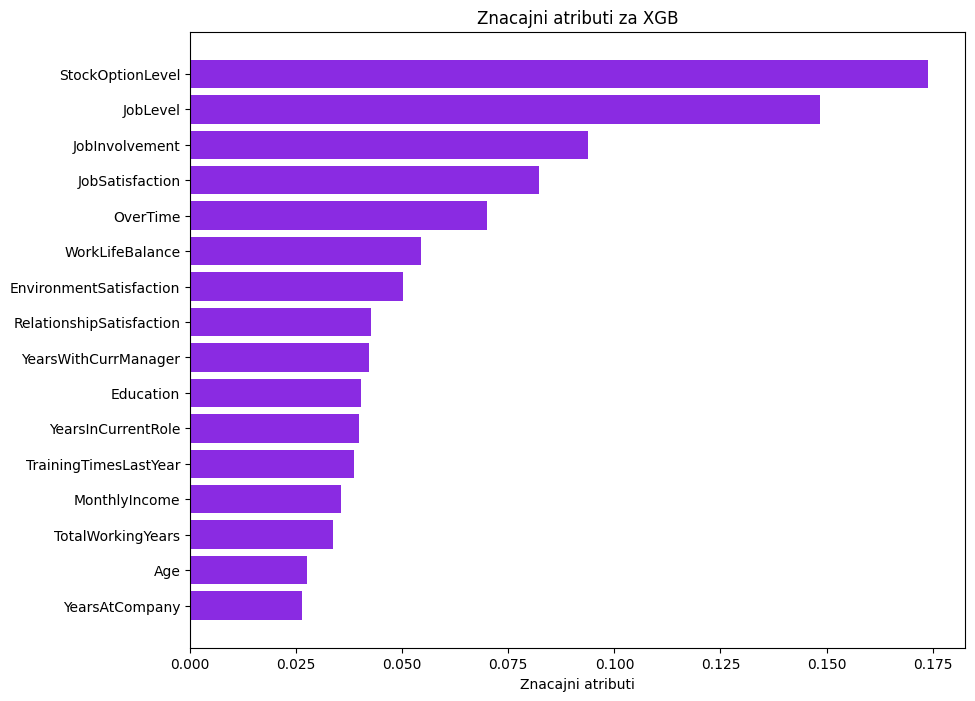

In [125]:
model_xgb = xgb.XGBClassifier()
model_xgb.fit(x_train, y_train)
y_pred_xgb = model_xgb.predict(x_test)
y_pred_prob_xgb = model_xgb.predict_proba(x_test)[:, 1]

print("########### MODEL XGB Classifier###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_xgb, x_train,y_train,x_test, y_test,y_pred_xgb, y_pred_prob_xgb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("XGB Classifier", y_test,y_pred_xgb, y_pred_prob_xgb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_xgb, "XGB", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "XGB",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

[LightGBM] [Info] Number of positive: 786, number of negative: 925
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1711, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459380 -> initscore=-0.162837
[LightGBM] [Info] Start training from score -0.162837
########### MODEL LGBM Classifier###########
[LightGBM] [Info] Number of positive: 707, number of negative: 832
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1539, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0

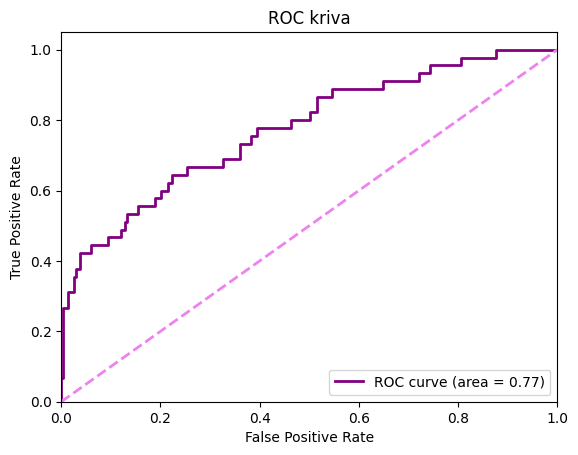

#################################
Accuracy (Tačnost): 0.8489208633093526
#################################
Precision (Preciznost): 0.5405405405405406
#################################
Recall(odziv): 0.4444444444444444
###############################
F1 Score: 0.4878048780487805
ROC AUC: 0.774344301382928
Confusion Matrix (matrica konfuzije):
[[216  17]
 [ 25  20]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.93      0.91       233
           1       0.54      0.44      0.49        45

    accuracy                           0.85       278
   macro avg       0.72      0.69      0.70       278
weighted avg       0.84      0.85      0.84       278




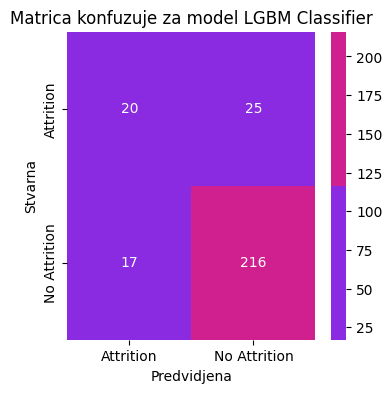

              precision    recall  f1-score   support

           0       0.90      0.93      0.91       233
           1       0.54      0.44      0.49        45

    accuracy                           0.85       278
   macro avg       0.72      0.69      0.70       278
weighted avg       0.84      0.85      0.84       278



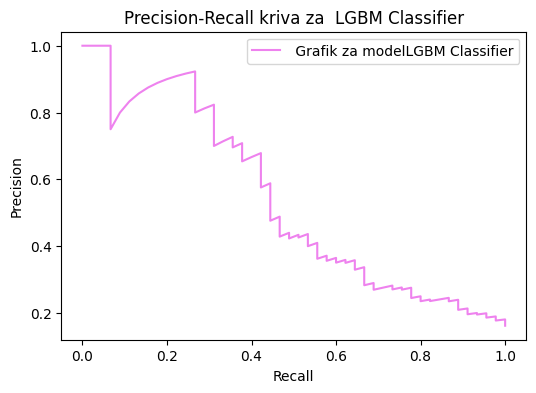

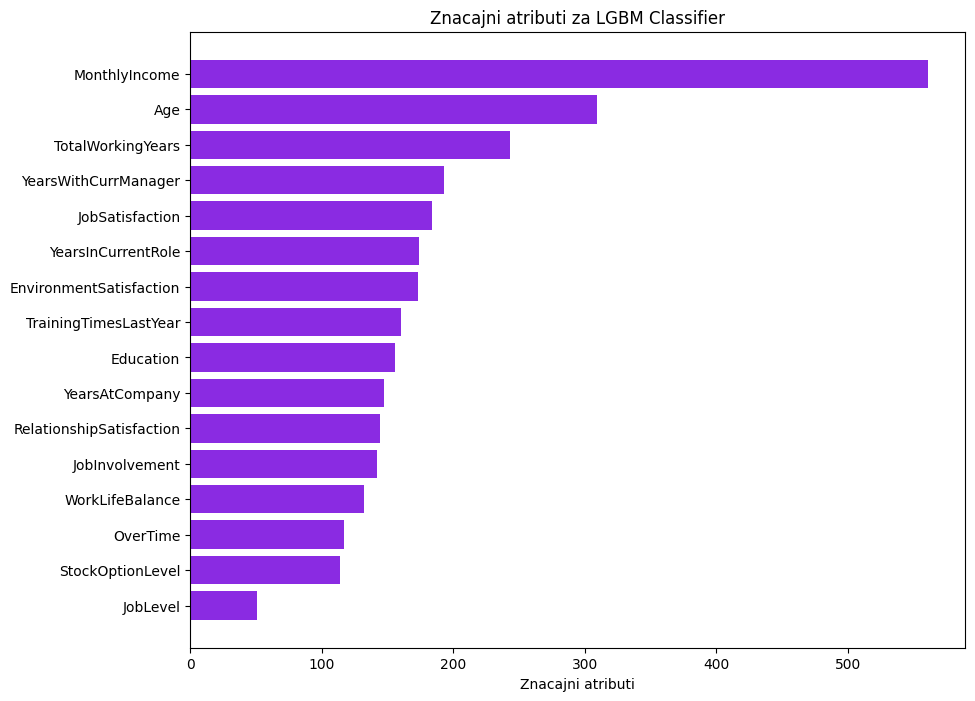

In [126]:
model_lgb = lgb.LGBMClassifier()
model_lgb.fit(x_train, y_train)
y_pred_lgb = model_lgb.predict(x_test)
y_pred_prob_lgb = model_lgb.predict_proba(x_test)[:, 1]

print("########### MODEL LGBM Classifier###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_lgb, x_train,y_train,x_test, y_test,y_pred_lgb, y_pred_prob_lgb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("LGBM Classifier", y_test,y_pred_lgb, y_pred_prob_lgb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_lgb, "LGBM Classifier", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "LGBM Classifier",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Learning rate set to 0.012958
0:	learn: 0.6866077	total: 130ms	remaining: 2m 10s
1:	learn: 0.6812800	total: 134ms	remaining: 1m 6s
2:	learn: 0.6749544	total: 138ms	remaining: 45.9s
3:	learn: 0.6684534	total: 144ms	remaining: 35.8s
4:	learn: 0.6624668	total: 149ms	remaining: 29.7s
5:	learn: 0.6563246	total: 154ms	remaining: 25.4s
6:	learn: 0.6495376	total: 163ms	remaining: 23.1s
7:	learn: 0.6442561	total: 168ms	remaining: 20.8s
8:	learn: 0.6400863	total: 172ms	remaining: 19s
9:	learn: 0.6343956	total: 177ms	remaining: 17.5s
10:	learn: 0.6287943	total: 182ms	remaining: 16.4s
11:	learn: 0.6240537	total: 188ms	remaining: 15.4s
12:	learn: 0.6190216	total: 196ms	remaining: 14.9s
13:	learn: 0.6137860	total: 201ms	remaining: 14.2s
14:	learn: 0.6086608	total: 209ms	remaining: 13.7s
15:	learn: 0.6046275	total: 214ms	remaining: 13.1s
16:	learn: 0.6002525	total: 220ms	remaining: 12.7s
17:	learn: 0.5963391	total: 226ms	remaining: 12.3s
18:	learn: 0.5916869	total: 231ms	remaining: 11.9s
19:	learn: 0

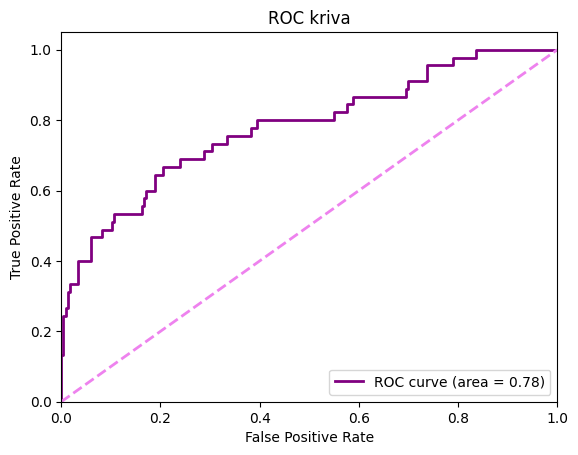

#################################
Accuracy (Tačnost): 0.8633093525179856
#################################
Precision (Preciznost): 0.6
#################################
Recall(odziv): 0.4666666666666667
###############################
F1 Score: 0.5249999999999999
ROC AUC: 0.7802575107296138
Confusion Matrix (matrica konfuzije):
[[219  14]
 [ 24  21]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.94      0.92       233
           1       0.60      0.47      0.52        45

    accuracy                           0.86       278
   macro avg       0.75      0.70      0.72       278
weighted avg       0.85      0.86      0.86       278




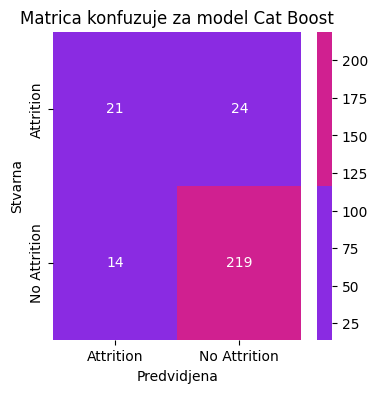

              precision    recall  f1-score   support

           0       0.90      0.94      0.92       233
           1       0.60      0.47      0.52        45

    accuracy                           0.86       278
   macro avg       0.75      0.70      0.72       278
weighted avg       0.85      0.86      0.86       278



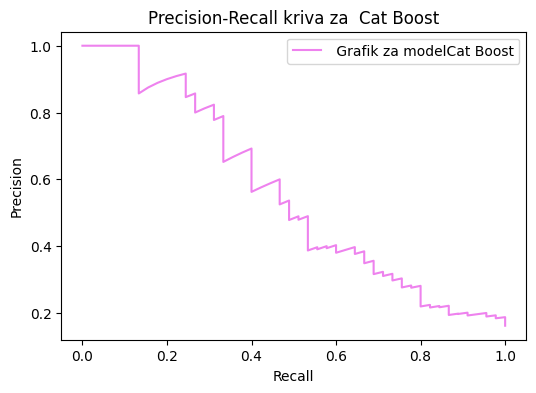

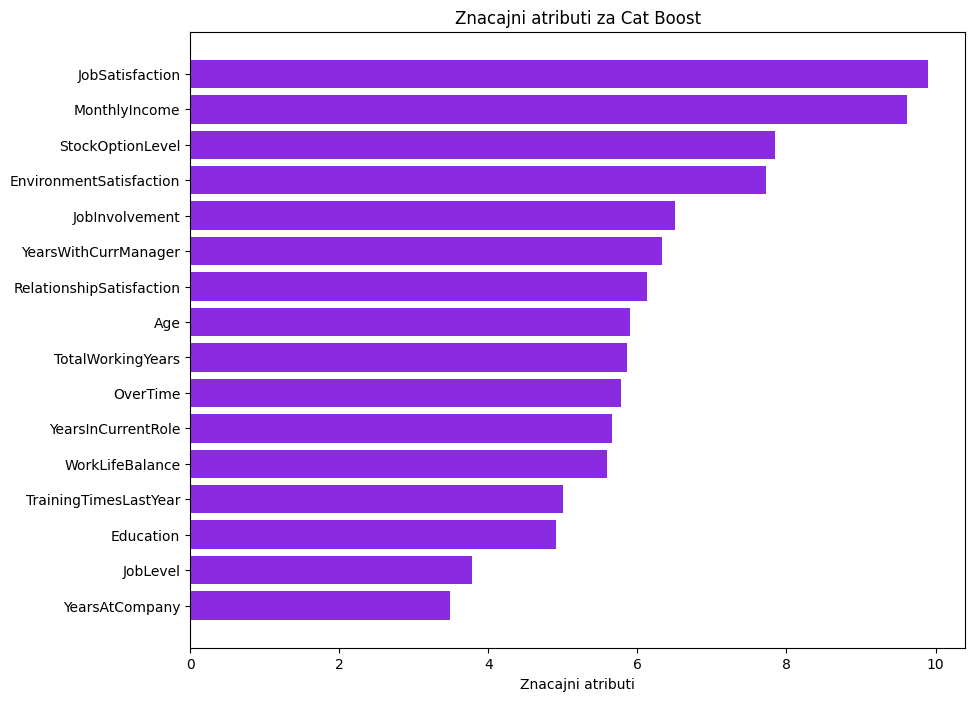

In [127]:
model_cb = cb.CatBoostClassifier()
model_cb.fit(x_train, y_train)
y_pred_cb = model_cb.predict(x_test)
y_pred_prob_cb = model_cb.predict_proba(x_test)[:, 1]

print("########### MODEL Cat Boost ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_cb, x_train,y_train,x_test, y_test,y_pred_cb, y_pred_prob_cb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Cat Boost", y_test,y_pred_cb, y_pred_prob_cb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_cb, "Cat Boost", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Cat Boost",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [128]:
#### JOS VISE OSNOVNIH MODELA

In [129]:
from sklearn.naive_bayes import GaussianNB

########### MODEL Naive Bayes ###########
Krosvalidacioni scopre:  83.36%
ROC_AUC Score :  68.56%


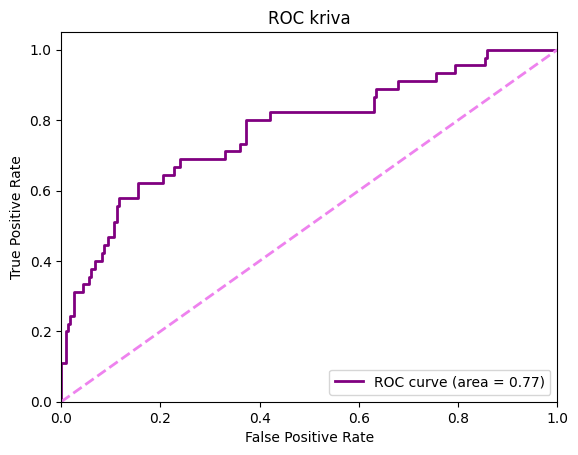

#################################
Accuracy (Tačnost): 0.6834532374100719
#################################
Precision (Preciznost): 0.29523809523809524
#################################
Recall(odziv): 0.6888888888888889
###############################
F1 Score: 0.41333333333333333
ROC AUC: 0.7725321888412017
Confusion Matrix (matrica konfuzije):
[[159  74]
 [ 14  31]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.92      0.68      0.78       233
           1       0.30      0.69      0.41        45

    accuracy                           0.68       278
   macro avg       0.61      0.69      0.60       278
weighted avg       0.82      0.68      0.72       278




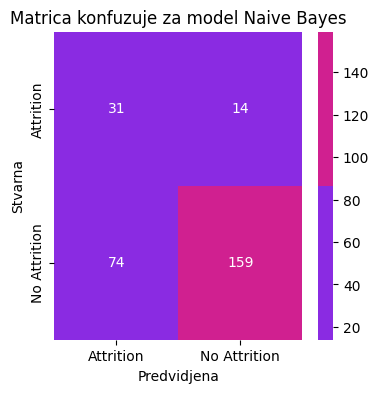

              precision    recall  f1-score   support

           0       0.92      0.68      0.78       233
           1       0.30      0.69      0.41        45

    accuracy                           0.68       278
   macro avg       0.61      0.69      0.60       278
weighted avg       0.82      0.68      0.72       278



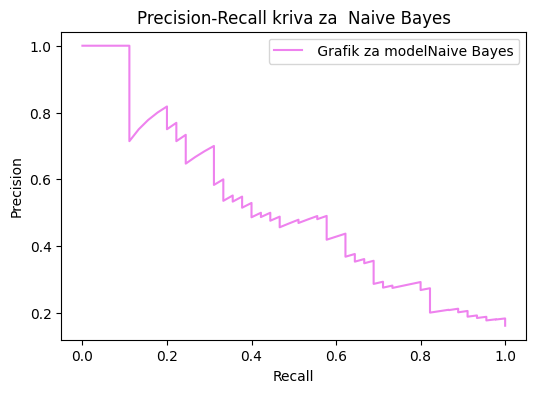

Model nema podržanu značajnost attributa


In [130]:
model_gnb = GaussianNB()
model_gnb.fit(x_train, y_train)
y_pred_gnb = model_gnb.predict(x_test)
y_pred_prob_gnb = model_gnb.predict_proba(x_test)[:, 1]

print("########### MODEL Naive Bayes ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_gnb, x_train,y_train,x_test, y_test,y_pred_gnb, y_pred_prob_gnb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Naive Bayes", y_test,y_pred_gnb, y_pred_prob_gnb)

lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_gnb, "Naive Bayes", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Naive Bayes",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [131]:
# from sklearn.svm import SVC

In [132]:
# model_svc = SVC(probability=True)
# model_svc.fit(x_train, y_train)
# y_pred_svc = model_svc.predict(x_test)
# y_pred_prob_svc = model_svc.predict_proba(x_test)[:, 1]

# print("########### MODEL Support Vector Machine ###########")
# krosvalidacija_i_prikaz_roc_auc_krive(model_svc, x_train,y_train,x_test, y_test,y_pred_svc, y_pred_prob_svc)

# evaluacija_modela_metrike("Support Vector Machine", y_test,y_pred_svc, y_pred_prob_svc)

In [133]:
from sklearn.model_selection import GridSearchCV

In [134]:
# OVO ZA MACHINE LEARNING STUDIO
# param_grids = {
#     'Logistic Regression': {
#         'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
#         'solver': ['lbfgs', 'liblinear', 'saga'],
#         'penalty': ['l2', 'none']
#     },
#     'Decision Tree': {
#         'max_depth': [None] + list(range(10, 51, 10)),
#         'min_samples_split': list(range(2, 21, 3)),
#         'min_samples_leaf': list(range(1, 11, 2)),
#         'criterion': ['gini', 'entropy']
#     },
#     'Random Forest': {
#         'n_estimators': list(range(50, 501, 50)),
#         'max_depth': [None] + list(range(10, 41, 10)),
#         'min_samples_split': list(range(2, 21, 3)),
#         'min_samples_leaf': list(range(1, 11, 2)),
#         'criterion': ['gini', 'entropy']
#     },
#     'Gradient Boosting': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'max_depth': list(range(3, 10, 2)),
#         'subsample': [0.7, 0.8, 0.9, 1.0],
#         'min_samples_split': list(range(2, 21, 3)),
#         'min_samples_leaf': list(range(1, 11, 2))
#     },
#     'AdaBoost': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.5, 1, 1.5]
#     },
#     'Bagging': {
#         'n_estimators': list(range(10, 201, 20)),
#         'max_samples': [0.5, 0.7, 0.9, 1.0],
#         'max_features': [0.5, 0.7, 0.9, 1.0]
#     },
#     'XGBoost': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'max_depth': list(range(3, 10, 2)),
#         'subsample': [0.7, 0.8, 0.9, 1.0],
#         'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
#         'gamma': [0, 0.1, 0.3, 0.5],
#         'reg_alpha': [0, 0.1, 0.5, 1],
#         'reg_lambda': [1, 1.5, 2, 3]
#     },
#     'LightGBM': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'num_leaves': list(range(31, 256, 31)),
#         'max_depth': [-1] + list(range(10, 41, 10)),
#         'subsample': [0.7, 0.8, 0.9, 1.0],
#         'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
#         'reg_alpha': [0, 0.1, 0.5, 1],
#         'reg_lambda': [1, 1.5, 2, 3]
#     },
#     'CatBoost': {
#         'iterations': list(range(100, 501, 100)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'depth': list(range(3, 10, 2)),
#         'l2_leaf_reg': list(range(1, 10, 2))
#     },
#     'GaussianNB': {
#         'var_smoothing': np.logspace(0, -9, num=100)
#     }
# }


In [135]:
param_grids = {
    'Logistic Regression': {
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['lbfgs', 'liblinear']
    },
    'Decision Tree': {
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5, 10,20]
    },
    'Random Forest': {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10,15,20, 30],
        'min_samples_split': [2, 5, 10]
    },
    'Gradient Boosting': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    },
    'AdaBoost': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 1]
    },
    'Bagging': {
        'n_estimators': [10, 50, 100],
        'max_samples': [0.5, 1.0],
        'max_features': [0.5, 1.0]
    },
    'XGBoost': {
        'n_estimators': [50, 100, 200,500,1000],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    },
    'LightGBM': {
        'n_estimators': [50, 100, 200,500,1000],
        'learning_rate': [0.01, 0.1, 0.2],
        'num_leaves': [31, 62, 127]
    },
    'CatBoost': {
        'iterations': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2],
        'depth': [3, 5, 7]
    },
    'GaussianNB': {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6]
    }
}


In [136]:
def treniranje_i_tjunovanje(model, param_grid, model_name):
    print(f"Treniranje modela {model_name} nakon optimizacije parametara ")
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='roc_auc')
    grid_search.fit(x_train, y_train)
    
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(x_test)
    y_pred_prob = best_model.predict_proba(x_test)[:, 1]
    feature_names=x_test.columns
   
    kros_val_score = krosvalidacija_i_prikaz_roc_auc_krive(best_model, x_train, y_train, x_test, y_test,y_pred,y_pred_prob)
    print(f"################ METRIKE ZA MODEL {model_name} sa optimizacijom parametara ##################")
    accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike( f"{model_name} sa optimizacijom parametara", y_test,y_pred,y_pred_prob)
    lista_znacajnih_atributa =prikaz_znacajnosti_atributa(best_model, model_name, feature_names)
    table_output=[accuracy,precision,recall,f1_score_,roc_auc_score_,kros_val_score,falseNegativi,"yes",grid_search.best_params_,lista_znacajnih_atributa]    
    return best_model,grid_search.best_params_,table_output


Treniranje modela Logistic Regression nakon optimizacije parametara 
Krosvalidacioni scopre:  88.95%
ROC_AUC Score :  65.39%


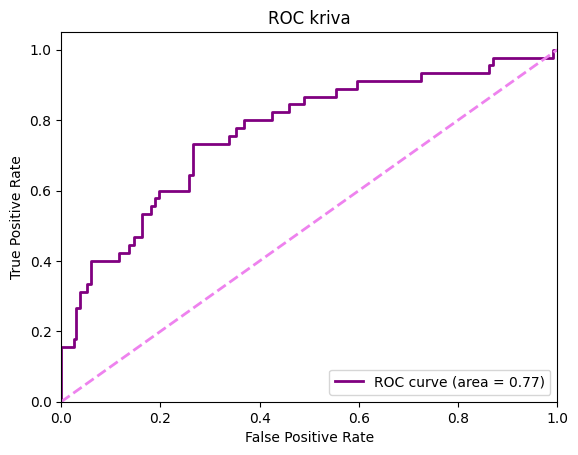

################ METRIKE ZA MODEL Logistic Regression sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.7805755395683454
#################################
Precision (Preciznost): 0.3620689655172414
#################################
Recall(odziv): 0.4666666666666667
###############################
F1 Score: 0.4077669902912621
ROC AUC: 0.7661421077730092
Confusion Matrix (matrica konfuzije):
[[196  37]
 [ 24  21]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.84      0.87       233
           1       0.36      0.47      0.41        45

    accuracy                           0.78       278
   macro avg       0.63      0.65      0.64       278
weighted avg       0.81      0.78      0.79       278




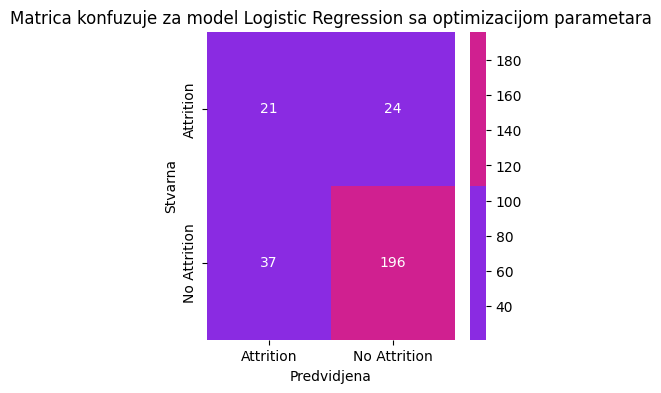

              precision    recall  f1-score   support

           0       0.89      0.84      0.87       233
           1       0.36      0.47      0.41        45

    accuracy                           0.78       278
   macro avg       0.63      0.65      0.64       278
weighted avg       0.81      0.78      0.79       278



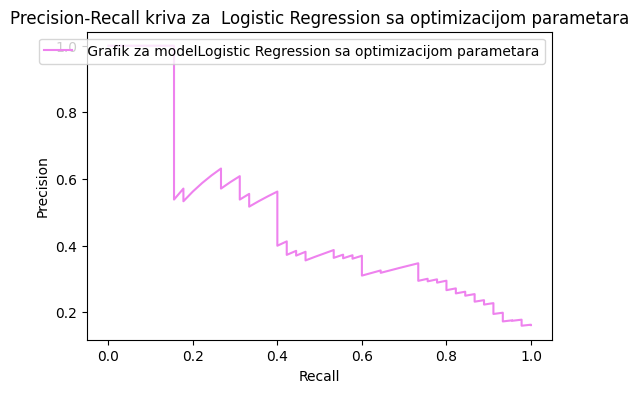

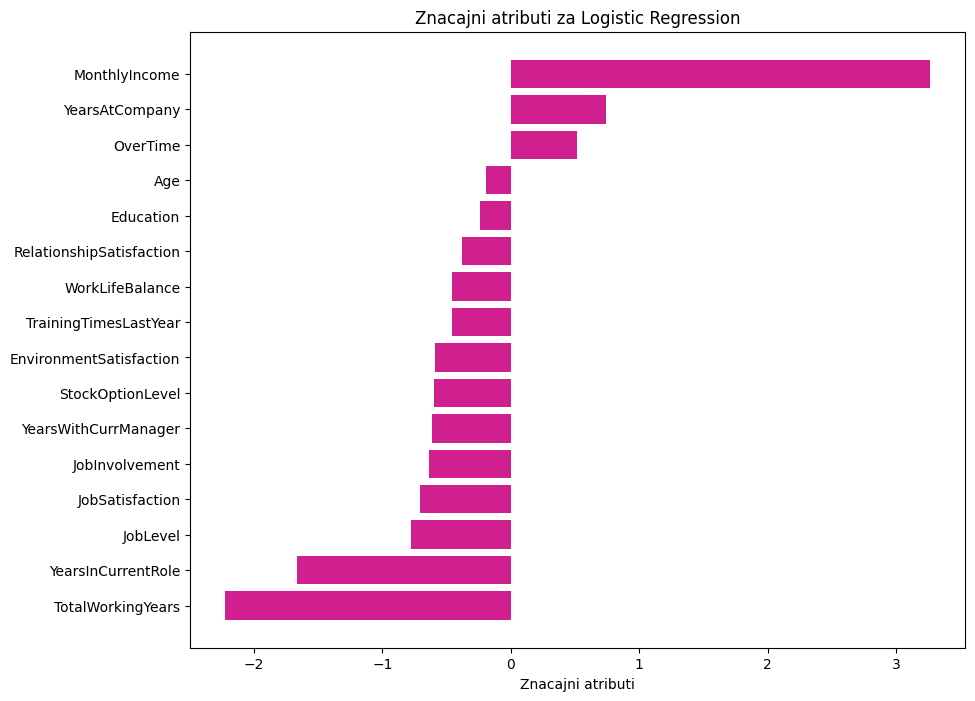

In [137]:
best_model_lr, best_params_lr, table_out_lr = treniranje_i_tjunovanje(LogisticRegression(), param_grids['Logistic Regression'], "Logistic Regression")

red_new= pd.DataFrame([{
"Ime modela": "Logistic Regression",
"Accuracy":table_out_lr[0],
"Precision":table_out_lr[1],
"Recall" :table_out_lr[2],
"F1-score" :table_out_lr[3],
"ROC_AUC_SCORE":table_out_lr[4],
"KrosvalidacioniScore":table_out_lr[5],
"FALSE NEGATIVI":table_out_lr[6],
"HIPERPARAMETRIZACIJA":table_out_lr[7],
"NAJBOLJI PARAMETRI":table_out_lr[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_lr[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela Decision Tree nakon optimizacije parametara 
Krosvalidacioni scopre:  84.42%
ROC_AUC Score :  60.05%


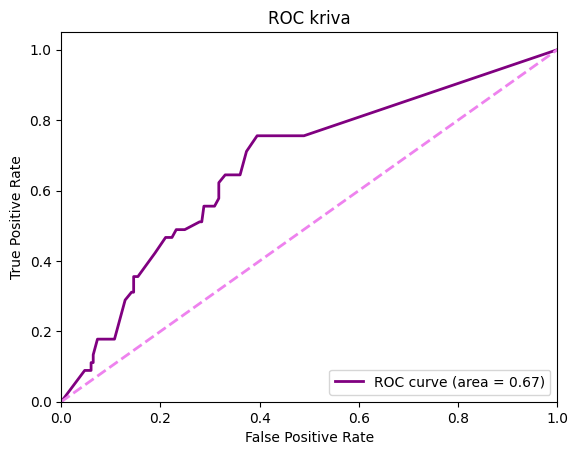

################ METRIKE ZA MODEL Decision Tree sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.7661870503597122
#################################
Precision (Preciznost): 0.3076923076923077
#################################
Recall(odziv): 0.35555555555555557
###############################
F1 Score: 0.32989690721649484
ROC AUC: 0.6737243681449689
Confusion Matrix (matrica konfuzije):
[[197  36]
 [ 29  16]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.87      0.85      0.86       233
           1       0.31      0.36      0.33        45

    accuracy                           0.77       278
   macro avg       0.59      0.60      0.59       278
weighted avg       0.78      0.77      0.77       278




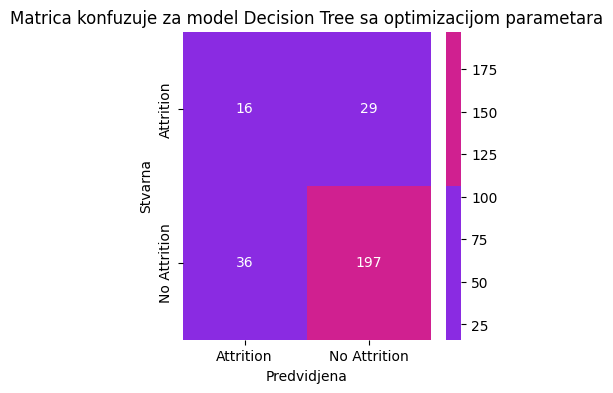

              precision    recall  f1-score   support

           0       0.87      0.85      0.86       233
           1       0.31      0.36      0.33        45

    accuracy                           0.77       278
   macro avg       0.59      0.60      0.59       278
weighted avg       0.78      0.77      0.77       278



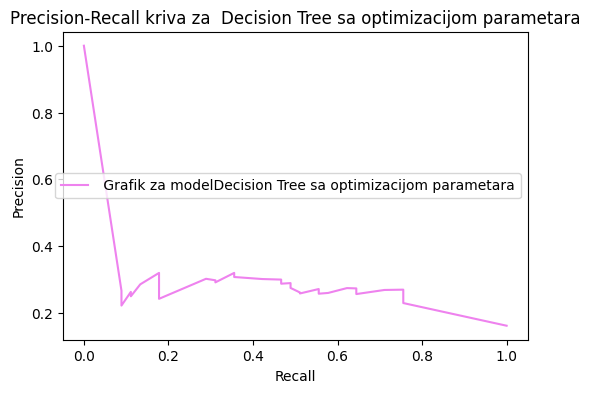

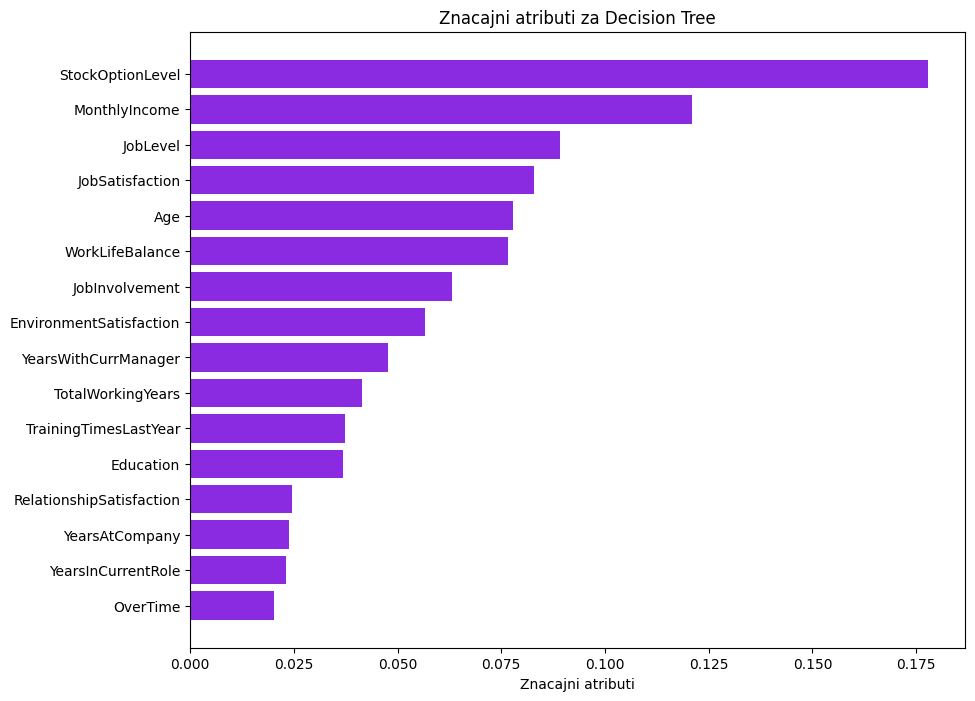

In [138]:
best_model_dt, best_params_dt, table_out_dt = treniranje_i_tjunovanje(DecisionTreeClassifier(), param_grids['Decision Tree'], "Decision Tree")
red_new= pd.DataFrame([{
"Ime modela": "Decision Tree",
"Accuracy":table_out_dt[0],
"Precision":table_out_dt[1],
"Recall" :table_out_dt[2],
"F1-score" :table_out_dt[3],
"ROC_AUC_SCORE":table_out_dt[4],
"KrosvalidacioniScore":table_out_dt[5],
"FALSE NEGATIVI":table_out_dt[6],
"HIPERPARAMETRIZACIJA":table_out_dt[7],
"NAJBOLJI PARAMETRI":table_out_dt[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_dt[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela Random Forest nakon optimizacije parametara 
Krosvalidacioni scopre:  94.69%
ROC_AUC Score :  69.22%


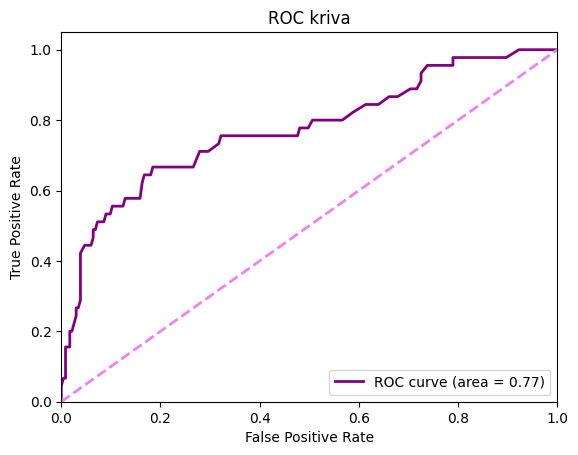

################ METRIKE ZA MODEL Random Forest sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8597122302158273
#################################
Precision (Preciznost): 0.5882352941176471
#################################
Recall(odziv): 0.4444444444444444
###############################
F1 Score: 0.5063291139240507
ROC AUC: 0.7734382451120648
Confusion Matrix (matrica konfuzije):
[[219  14]
 [ 25  20]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.94      0.92       233
           1       0.59      0.44      0.51        45

    accuracy                           0.86       278
   macro avg       0.74      0.69      0.71       278
weighted avg       0.85      0.86      0.85       278




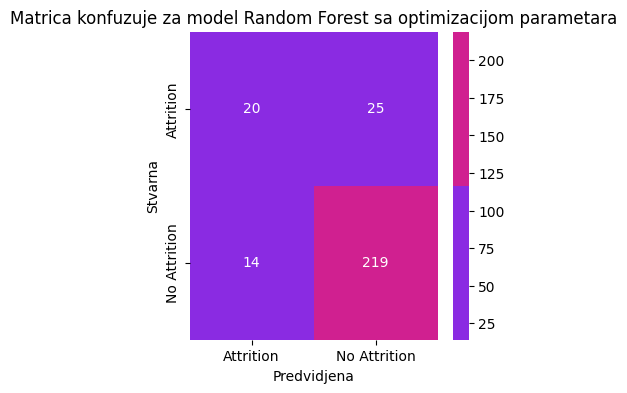

              precision    recall  f1-score   support

           0       0.90      0.94      0.92       233
           1       0.59      0.44      0.51        45

    accuracy                           0.86       278
   macro avg       0.74      0.69      0.71       278
weighted avg       0.85      0.86      0.85       278



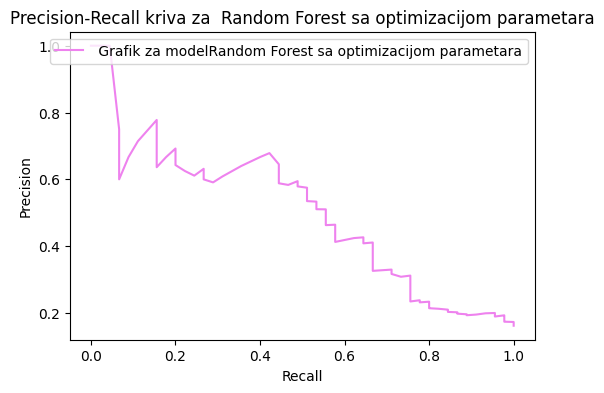

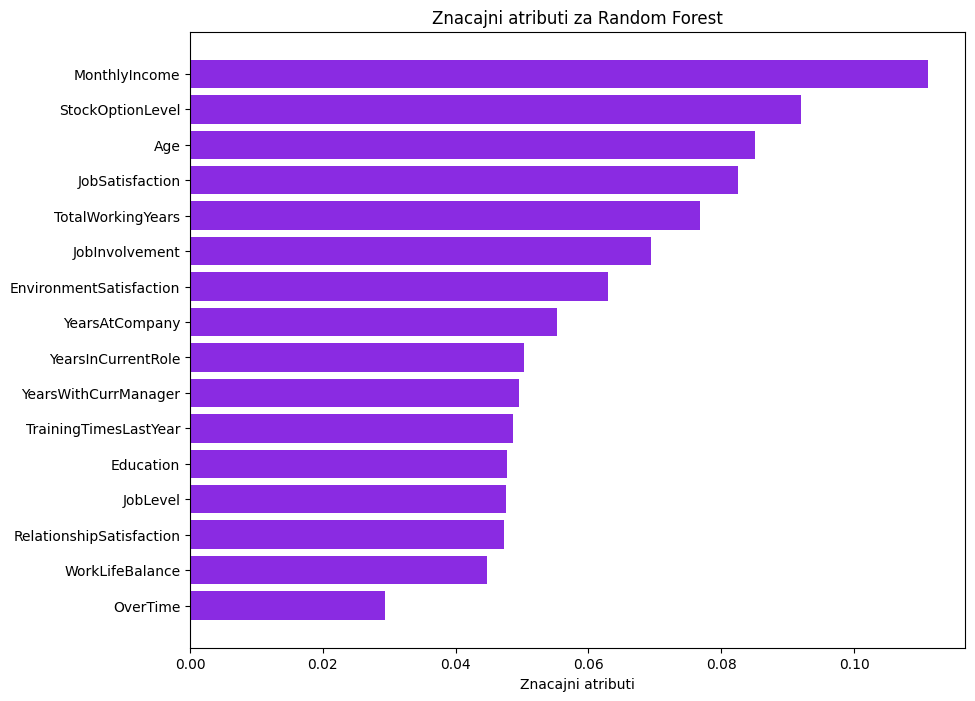

In [139]:
best_model_rf, best_params_rf, table_out_rf = treniranje_i_tjunovanje(RandomForestClassifier(), param_grids['Random Forest'], "Random Forest")

red_new= pd.DataFrame([{
"Ime modela": "Random Forest",
"Accuracy":table_out_rf[0],
"Precision":table_out_rf[1],
"Recall" :table_out_rf[2],
"F1-score" :table_out_rf[3],
"ROC_AUC_SCORE":table_out_rf[4],
"KrosvalidacioniScore":table_out_rf[5],
"FALSE NEGATIVI":table_out_rf[6],
"HIPERPARAMETRIZACIJA":table_out_rf[7],
"NAJBOLJI PARAMETRI":table_out_rf[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_rf[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela Gradient Boosting nakon optimizacije parametara 
Krosvalidacioni scopre:  94.72%
ROC_AUC Score :  67.89%


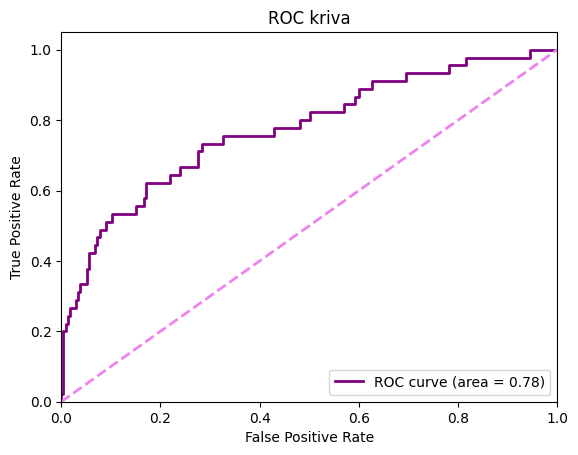

################ METRIKE ZA MODEL Gradient Boosting sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8525179856115108
#################################
Precision (Preciznost): 0.5588235294117647
#################################
Recall(odziv): 0.4222222222222222
###############################
F1 Score: 0.48101265822784806
ROC AUC: 0.7751072961373391
Confusion Matrix (matrica konfuzije):
[[218  15]
 [ 26  19]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.94      0.91       233
           1       0.56      0.42      0.48        45

    accuracy                           0.85       278
   macro avg       0.73      0.68      0.70       278
weighted avg       0.84      0.85      0.84       278




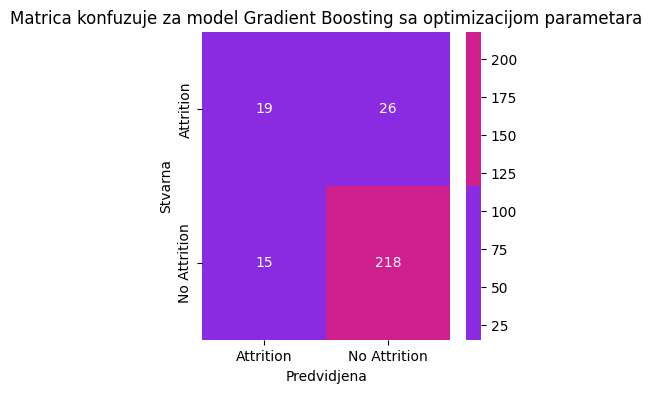

              precision    recall  f1-score   support

           0       0.89      0.94      0.91       233
           1       0.56      0.42      0.48        45

    accuracy                           0.85       278
   macro avg       0.73      0.68      0.70       278
weighted avg       0.84      0.85      0.84       278



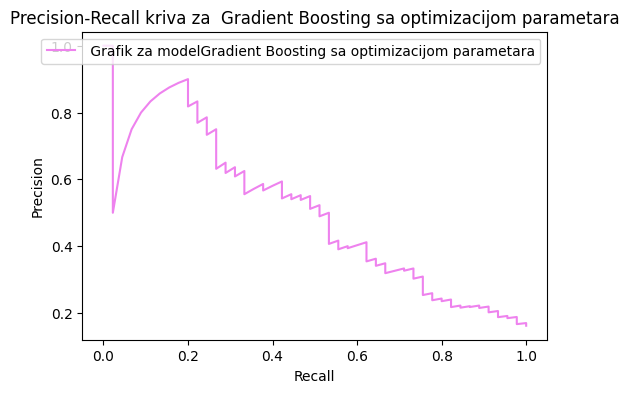

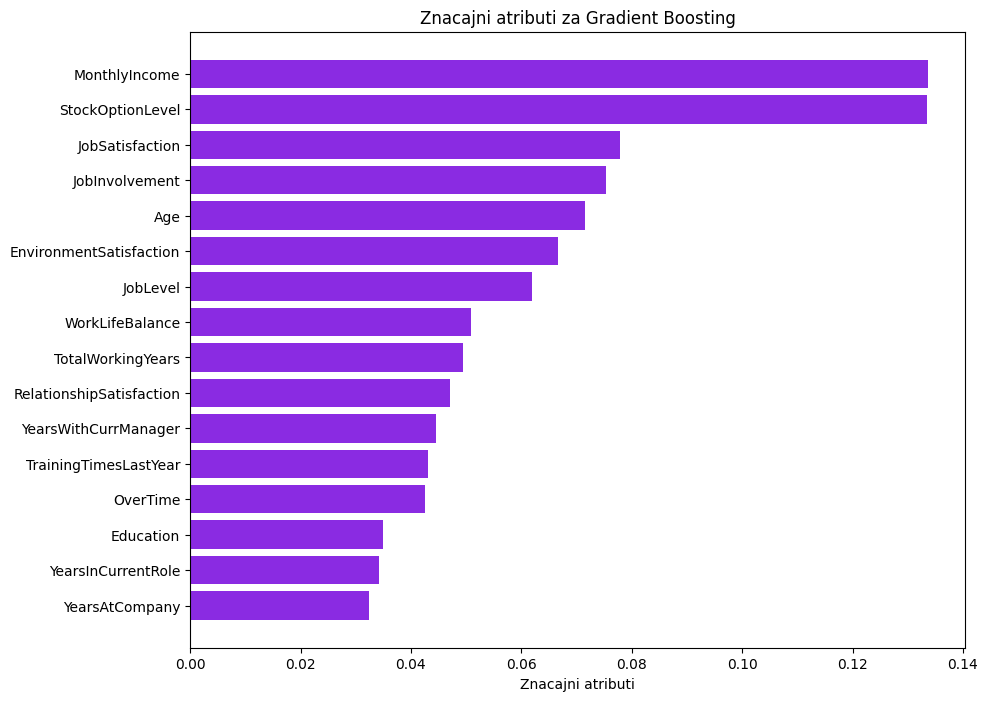

In [140]:
best_model_gb,best_params_gb, table_out_gb = treniranje_i_tjunovanje(GradientBoostingClassifier(), param_grids['Gradient Boosting'], "Gradient Boosting")

red_new= pd.DataFrame([{
"Ime modela": "Gradient Boosting",
"Accuracy":table_out_gb[0],
"Precision":table_out_gb[1],
"Recall" :table_out_gb[2],
"F1-score" :table_out_gb[3],
"ROC_AUC_SCORE":table_out_gb[4],
"KrosvalidacioniScore":table_out_gb[5],
"FALSE NEGATIVI":table_out_gb[6],
"HIPERPARAMETRIZACIJA":table_out_gb[7],
"NAJBOLJI PARAMETRI":table_out_gb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_gb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela AdaBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  90.56%
ROC_AUC Score :  63.60%


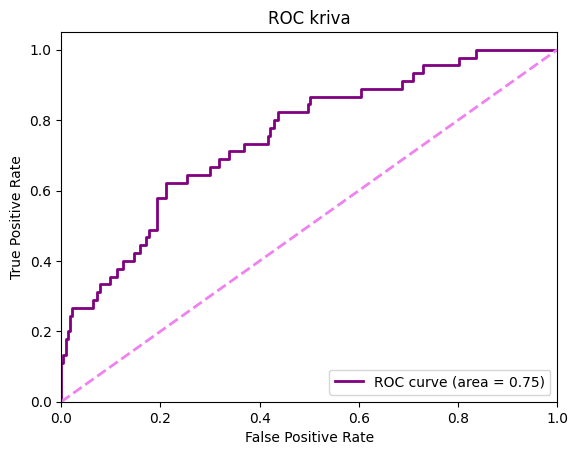

################ METRIKE ZA MODEL AdaBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.7805755395683454
#################################
Precision (Preciznost): 0.35185185185185186
#################################
Recall(odziv): 0.4222222222222222
###############################
F1 Score: 0.3838383838383838
ROC AUC: 0.7525035765379112
Confusion Matrix (matrica konfuzije):
[[198  35]
 [ 26  19]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.88      0.85      0.87       233
           1       0.35      0.42      0.38        45

    accuracy                           0.78       278
   macro avg       0.62      0.64      0.63       278
weighted avg       0.80      0.78      0.79       278




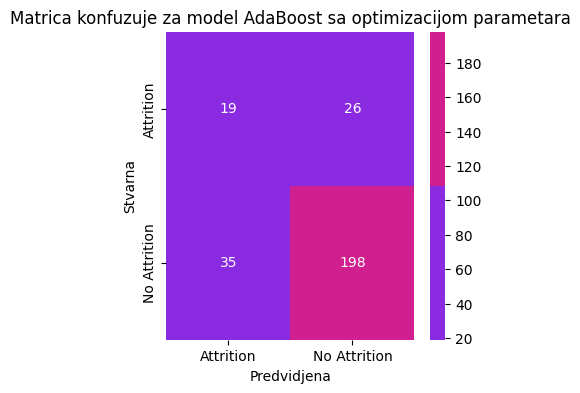

              precision    recall  f1-score   support

           0       0.88      0.85      0.87       233
           1       0.35      0.42      0.38        45

    accuracy                           0.78       278
   macro avg       0.62      0.64      0.63       278
weighted avg       0.80      0.78      0.79       278



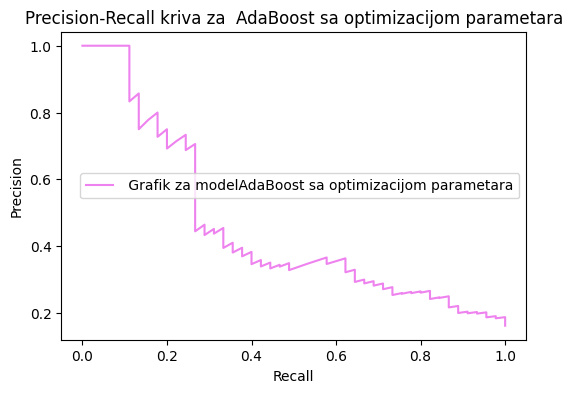

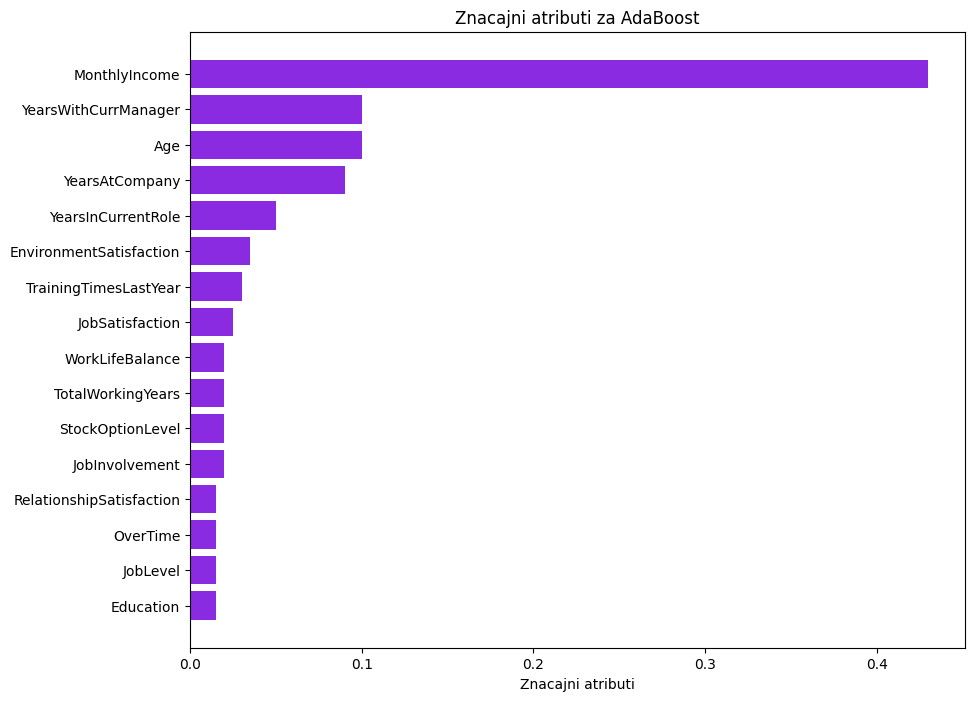

In [141]:
best_model_ab,best_params_ab, table_out_ab = treniranje_i_tjunovanje(AdaBoostClassifier(), param_grids['AdaBoost'], "AdaBoost")

red_new= pd.DataFrame([{
"Ime modela": "Ada Boost",
"Accuracy":table_out_ab[0],
"Precision":table_out_ab[1],
"Recall" :table_out_ab[2],
"F1-score" :table_out_ab[3],
"ROC_AUC_SCORE":table_out_ab[4],
"KrosvalidacioniScore":table_out_ab[5],
"FALSE NEGATIVI":table_out_ab[6],
"HIPERPARAMETRIZACIJA":table_out_ab[7],
"NAJBOLJI PARAMETRI":table_out_ab[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_ab[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela Bagging nakon optimizacije parametara 
Krosvalidacioni scopre:  94.85%
ROC_AUC Score :  71.44%


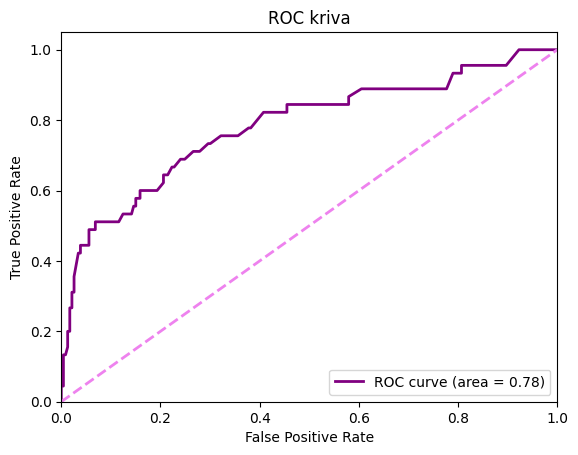

################ METRIKE ZA MODEL Bagging sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8669064748201439
#################################
Precision (Preciznost): 0.6111111111111112
#################################
Recall(odziv): 0.4888888888888889
###############################
F1 Score: 0.5432098765432098
ROC AUC: 0.7828326180257511
Confusion Matrix (matrica konfuzije):
[[219  14]
 [ 23  22]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.94      0.92       233
           1       0.61      0.49      0.54        45

    accuracy                           0.87       278
   macro avg       0.76      0.71      0.73       278
weighted avg       0.86      0.87      0.86       278




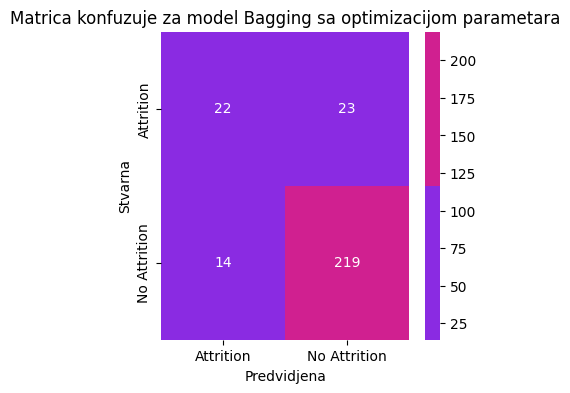

              precision    recall  f1-score   support

           0       0.90      0.94      0.92       233
           1       0.61      0.49      0.54        45

    accuracy                           0.87       278
   macro avg       0.76      0.71      0.73       278
weighted avg       0.86      0.87      0.86       278



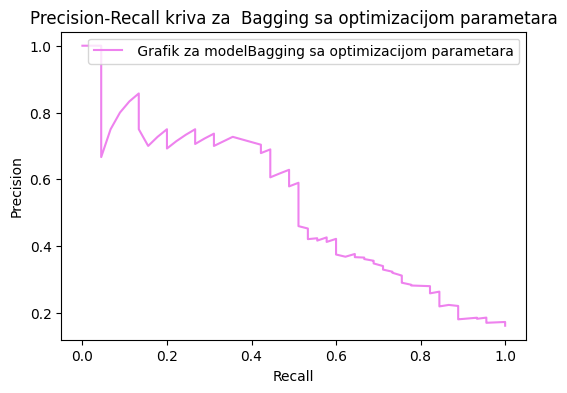

Model nema podržanu značajnost attributa


In [142]:
best_model_bg, best_params_bg, table_out_bg = treniranje_i_tjunovanje(BaggingClassifier(), param_grids['Bagging'], "Bagging")
red_new= pd.DataFrame([{
"Ime modela": "Bagging",
"Accuracy":table_out_bg[0],
"Precision":table_out_bg[1],
"Recall" :table_out_bg[2],
"F1-score" :table_out_bg[3],
"ROC_AUC_SCORE":table_out_bg[4],
"KrosvalidacioniScore":table_out_bg[5],
"FALSE NEGATIVI":table_out_bg[6],
"HIPERPARAMETRIZACIJA":table_out_bg[7],
"NAJBOLJI PARAMETRI":table_out_bg[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_bg[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela XGBoost nakon optimizacije parametara 


c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `u

Krosvalidacioni scopre:  94.37%
ROC_AUC Score :  69.69%


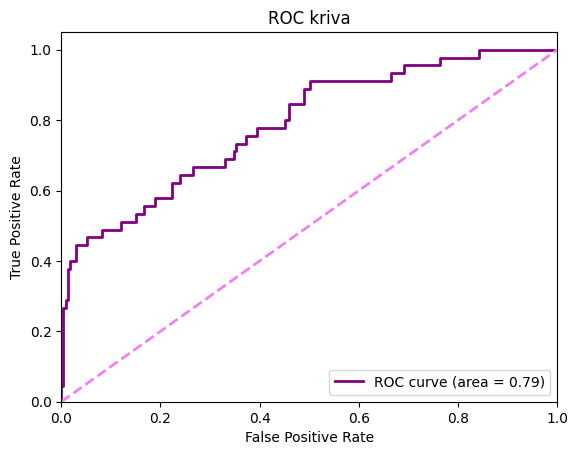

################ METRIKE ZA MODEL XGBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8525179856115108
#################################
Precision (Preciznost): 0.5526315789473685
#################################
Recall(odziv): 0.4666666666666667
###############################
F1 Score: 0.5060240963855421
ROC AUC: 0.7888412017167382
Confusion Matrix (matrica konfuzije):
[[216  17]
 [ 24  21]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.93      0.91       233
           1       0.55      0.47      0.51        45

    accuracy                           0.85       278
   macro avg       0.73      0.70      0.71       278
weighted avg       0.84      0.85      0.85       278




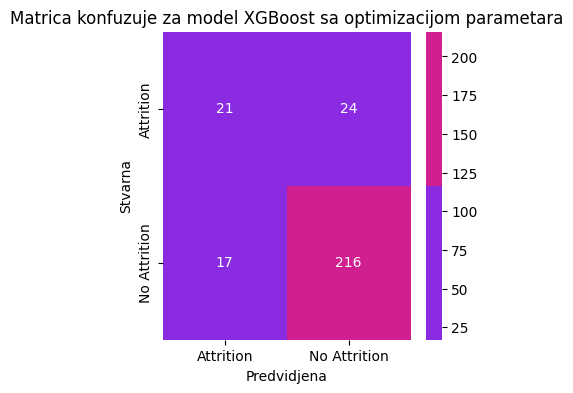

              precision    recall  f1-score   support

           0       0.90      0.93      0.91       233
           1       0.55      0.47      0.51        45

    accuracy                           0.85       278
   macro avg       0.73      0.70      0.71       278
weighted avg       0.84      0.85      0.85       278



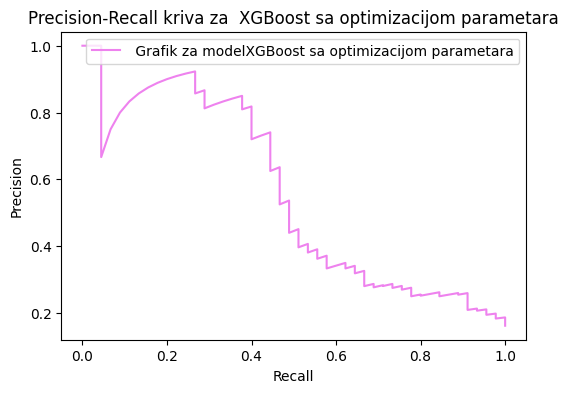

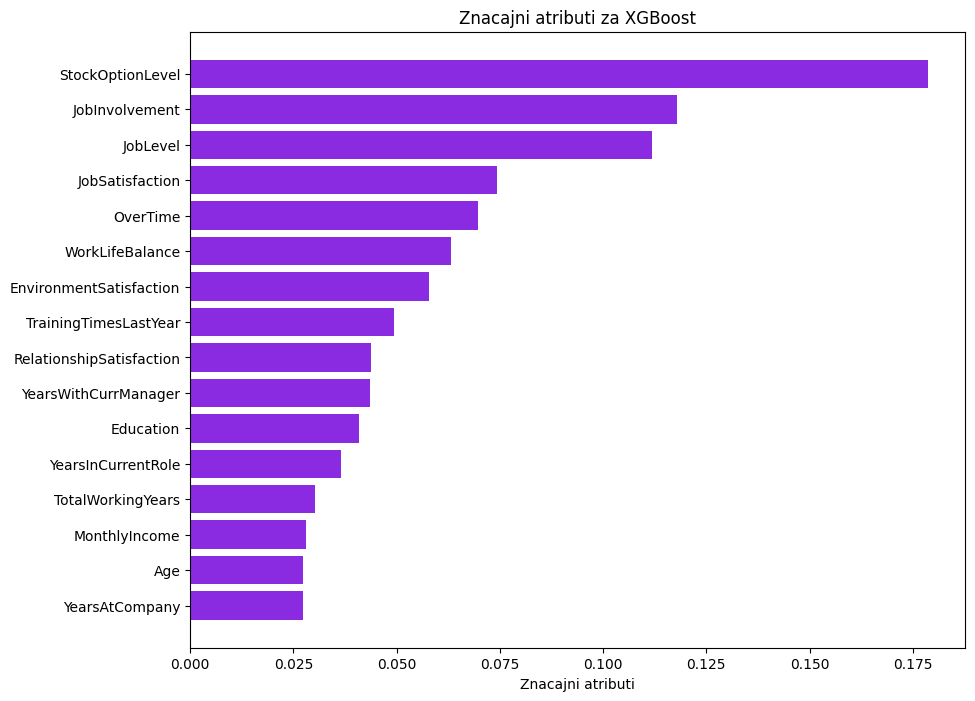

In [143]:
best_model_xgb, best_params_xgb, table_out_xgb = treniranje_i_tjunovanje(xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'), param_grids['XGBoost'], "XGBoost")
red_new= pd.DataFrame([{
"Ime modela": "XGBoost",
"Accuracy":table_out_xgb[0],
"Precision":table_out_xgb[1],
"Recall" :table_out_xgb[2],
"F1-score" :table_out_xgb[3],
"ROC_AUC_SCORE":table_out_xgb[4],
"KrosvalidacioniScore":table_out_xgb[5],
"FALSE NEGATIVI":table_out_xgb[6],
"HIPERPARAMETRIZACIJA":table_out_xgb[7],
"NAJBOLJI PARAMETRI":table_out_xgb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_xgb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela LightGBM nakon optimizacije parametara 
[LightGBM] [Info] Number of positive: 628, number of negative: 740
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 438
[LightGBM] [Info] Number of data points in the train set: 1368, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459064 -> initscore=-0.164110
[LightGBM] [Info] Start training from score -0.164110
[LightGBM] [Info] Number of positive: 629, number of negative: 740
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1369, number of used features: 16
[LightGBM] [Info] [binary:BoostFromS

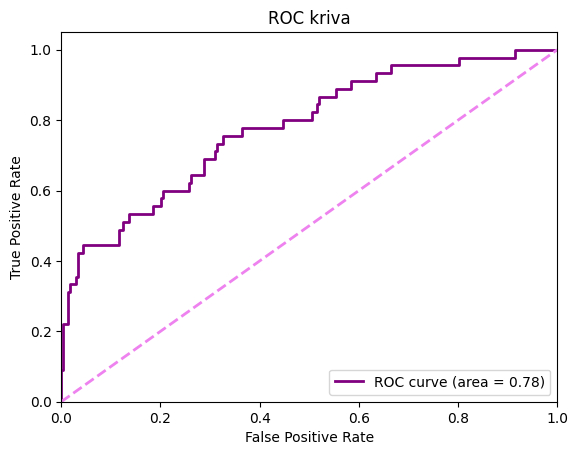

################ METRIKE ZA MODEL LightGBM sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8633093525179856
#################################
Precision (Preciznost): 0.6060606060606061
#################################
Recall(odziv): 0.4444444444444444
###############################
F1 Score: 0.5128205128205128
ROC AUC: 0.7798760133524081
Confusion Matrix (matrica konfuzije):
[[220  13]
 [ 25  20]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.94      0.92       233
           1       0.61      0.44      0.51        45

    accuracy                           0.86       278
   macro avg       0.75      0.69      0.72       278
weighted avg       0.85      0.86      0.85       278




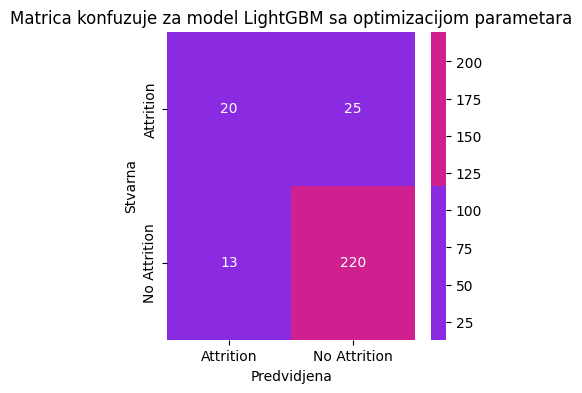

              precision    recall  f1-score   support

           0       0.90      0.94      0.92       233
           1       0.61      0.44      0.51        45

    accuracy                           0.86       278
   macro avg       0.75      0.69      0.72       278
weighted avg       0.85      0.86      0.85       278



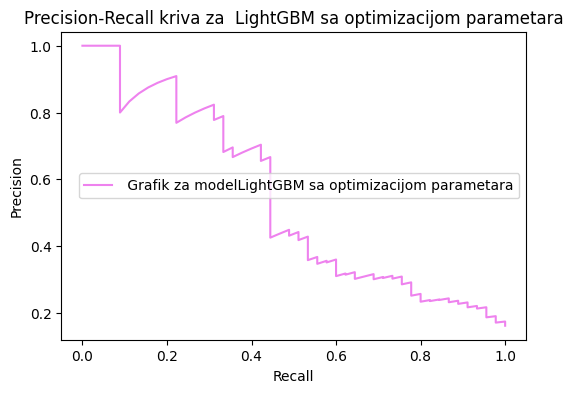

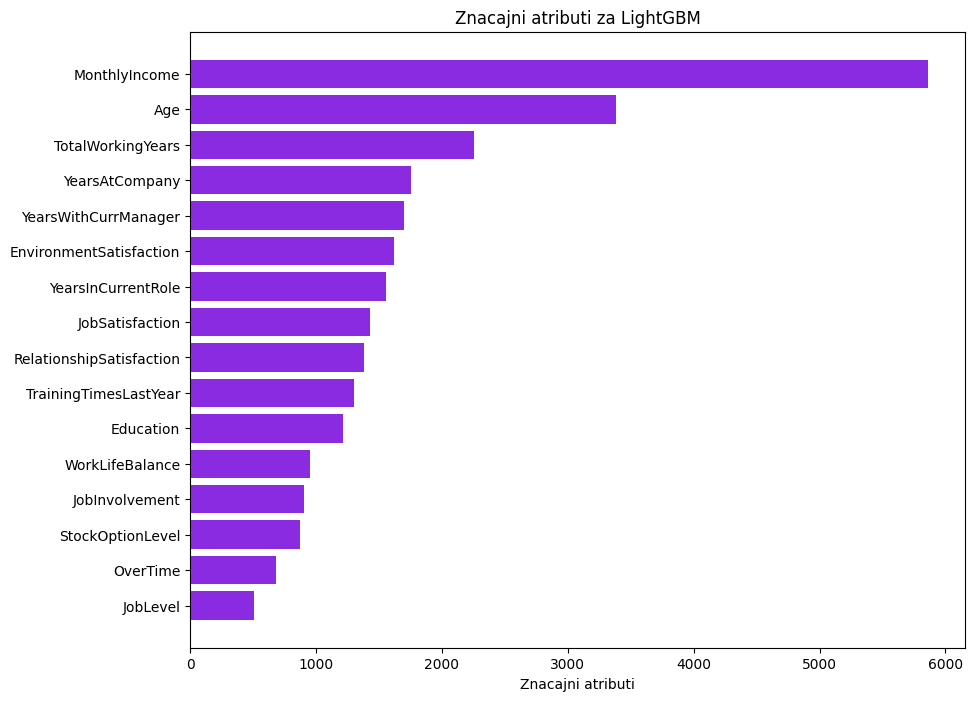

In [144]:
best_model_lgb,best_params_lgb, table_out_lgb = treniranje_i_tjunovanje(lgb.LGBMClassifier(), param_grids['LightGBM'], "LightGBM")
red_new= pd.DataFrame([{
"Ime modela": "LightGBM",
"Accuracy":table_out_lgb[0],
"Precision":table_out_lgb[1],
"Recall" :table_out_lgb[2],
"F1-score" :table_out_lgb[3],
"ROC_AUC_SCORE":table_out_lgb[4],
"KrosvalidacioniScore":table_out_lgb[5],
"FALSE NEGATIVI":table_out_lgb[6],
"HIPERPARAMETRIZACIJA":table_out_lgb[7],
"NAJBOLJI PARAMETRI":table_out_lgb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_lgb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela CatBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  95.18%
ROC_AUC Score :  68.32%


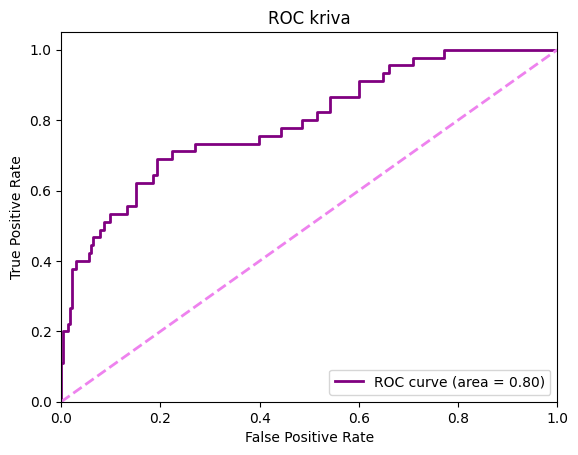

################ METRIKE ZA MODEL CatBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8597122302158273
#################################
Precision (Preciznost): 0.59375
#################################
Recall(odziv): 0.4222222222222222
###############################
F1 Score: 0.49350649350649345
ROC AUC: 0.7954220314735335
Confusion Matrix (matrica konfuzije):
[[220  13]
 [ 26  19]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.94      0.92       233
           1       0.59      0.42      0.49        45

    accuracy                           0.86       278
   macro avg       0.74      0.68      0.71       278
weighted avg       0.85      0.86      0.85       278




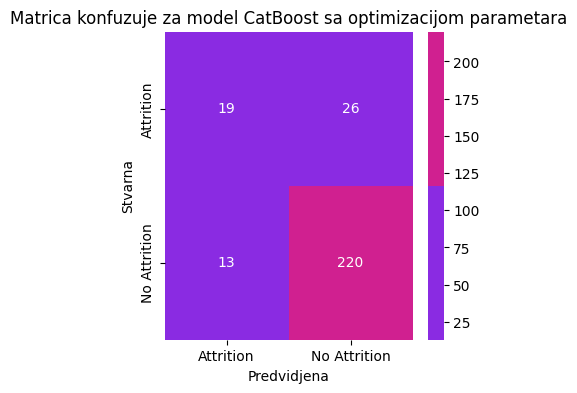

              precision    recall  f1-score   support

           0       0.89      0.94      0.92       233
           1       0.59      0.42      0.49        45

    accuracy                           0.86       278
   macro avg       0.74      0.68      0.71       278
weighted avg       0.85      0.86      0.85       278



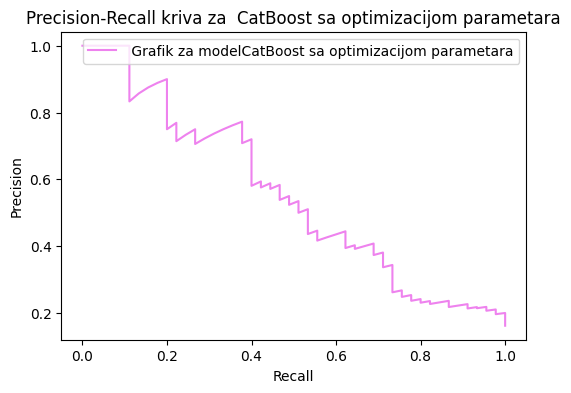

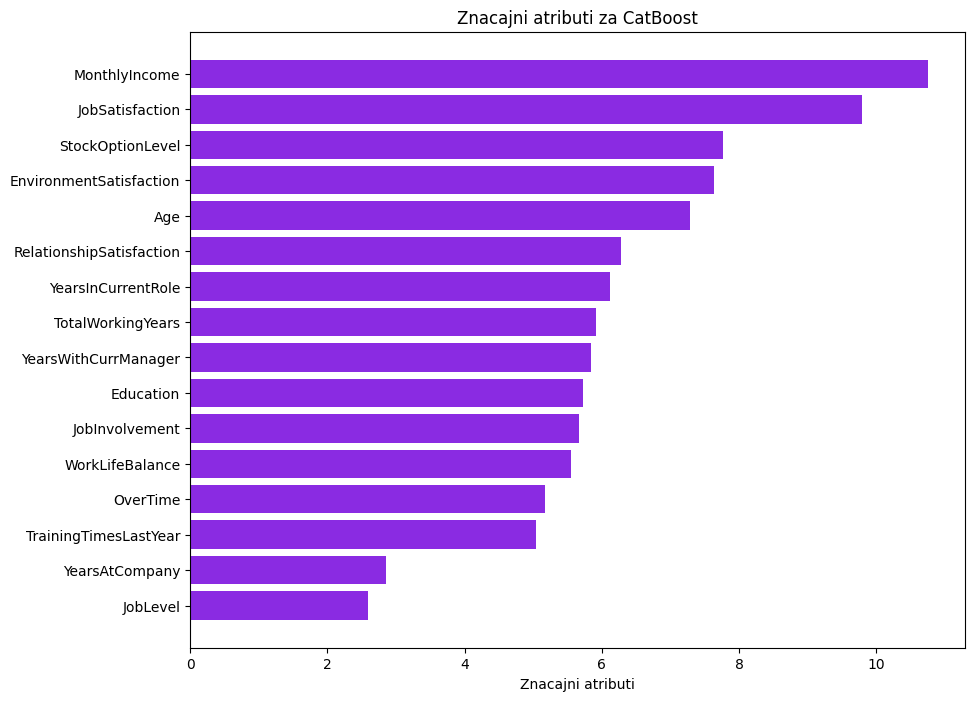

In [145]:
best_model_cb, best_params_cb, table_out_cb = treniranje_i_tjunovanje(cb.CatBoostClassifier(silent=True), param_grids['CatBoost'], "CatBoost")
red_new= pd.DataFrame([{
"Ime modela": "CatBoost",
"Accuracy":table_out_cb[0],
"Precision":table_out_cb[1],
"Recall" :table_out_cb[2],
"F1-score" :table_out_cb[3],
"ROC_AUC_SCORE":table_out_cb[4],
"KrosvalidacioniScore":table_out_cb[5],
"FALSE NEGATIVI":table_out_cb[6],
"HIPERPARAMETRIZACIJA":table_out_cb[7],
"NAJBOLJI PARAMETRI":table_out_cb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_cb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [146]:
#best_params_svc = treniranje_i_tjunovanje(SVC(probability=True), param_grids['SVC'], "Support Vector Machine")

Treniranje modela Naive Bayes nakon optimizacije parametara 
Krosvalidacioni scopre:  83.36%
ROC_AUC Score :  68.56%


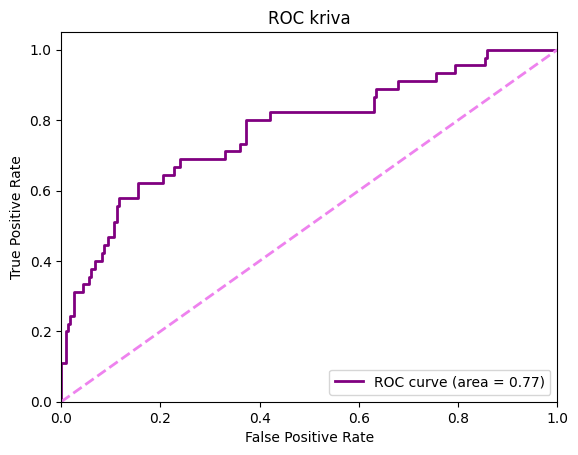

################ METRIKE ZA MODEL Naive Bayes sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.6834532374100719
#################################
Precision (Preciznost): 0.29523809523809524
#################################
Recall(odziv): 0.6888888888888889
###############################
F1 Score: 0.41333333333333333
ROC AUC: 0.7725321888412017
Confusion Matrix (matrica konfuzije):
[[159  74]
 [ 14  31]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.92      0.68      0.78       233
           1       0.30      0.69      0.41        45

    accuracy                           0.68       278
   macro avg       0.61      0.69      0.60       278
weighted avg       0.82      0.68      0.72       278




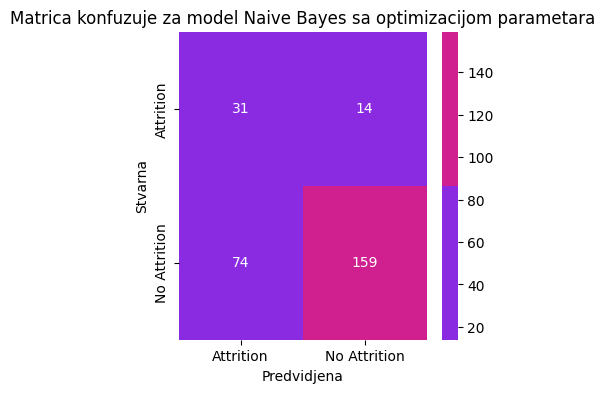

              precision    recall  f1-score   support

           0       0.92      0.68      0.78       233
           1       0.30      0.69      0.41        45

    accuracy                           0.68       278
   macro avg       0.61      0.69      0.60       278
weighted avg       0.82      0.68      0.72       278



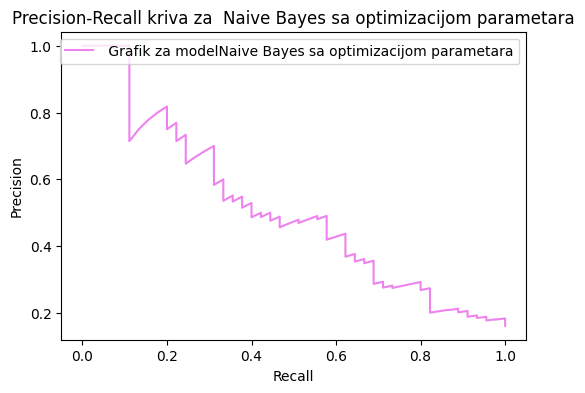

Model nema podržanu značajnost attributa


In [147]:
best_model,best_params_NB, table_out_nb = treniranje_i_tjunovanje(GaussianNB(), param_grids['GaussianNB'], "Naive Bayes")
red_new= pd.DataFrame([{
"Ime modela": "Naive Bayes",
"Accuracy":table_out_nb[0],
"Precision":table_out_nb[1],
"Recall" :table_out_nb[2],
"F1-score" :table_out_nb[3],
"ROC_AUC_SCORE":table_out_nb[4],
"KrosvalidacioniScore":table_out_nb[5],
"FALSE NEGATIVI":table_out_nb[6],
"HIPERPARAMETRIZACIJA":table_out_nb[7],
"NAJBOLJI PARAMETRI":table_out_nb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_nb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [164]:
REZULTATI_TABELA.sort_values(by='ROC_AUC_SCORE', ascending=False)

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
18,CatBoost,0.859712,0.593750,0.422222,0.493506,0.795422,0.951795,26,yes,"{'depth': 7, 'iterations': 300, 'learning_rate...","[JobLevel, YearsAtCompany, TrainingTimesLastYear]"
16,XGBoost,0.852518,0.552632,0.466667,0.506024,0.788841,0.943714,24,yes,"{'learning_rate': 0.2, 'max_depth': 7, 'n_esti...","[YearsAtCompany, Age, MonthlyIncome]"
6,XGB,0.848921,0.538462,0.466667,0.500000,0.786457,0.940505,24,NO,NONE,"[YearsAtCompany, Age, TotalWorkingYears]"
2,Random Forest,0.870504,0.655172,0.422222,0.513514,0.783643,0.945132,26,NO,NONE,"[OverTime, WorkLifeBalance, Education]"
15,Bagging,0.866906,0.611111,0.488889,0.543210,0.782833,0.947421,23,yes,"{'max_features': 0.5, 'max_samples': 1.0, 'n_e...",[]
8,Cat Boost,0.863309,0.600000,0.466667,0.525000,0.780258,0.944218,24,NO,NONE,"[YearsAtCompany, JobLevel, Education]"
17,LightGBM,0.863309,0.606061,0.444444,0.512821,0.779876,0.946086,25,yes,"{'learning_rate': 0.1, 'n_estimators': 1000, '...","[JobLevel, OverTime, StockOptionLevel]"
13,Gradient Boosting,0.852518,0.558824,0.422222,0.481013,0.775107,0.947004,26,yes,"{'learning_rate': 0.2, 'max_depth': 7, 'n_esti...","[YearsAtCompany, YearsInCurrentRole, Education]"
7,LGBM Classifier,0.848921,0.540541,0.444444,0.487805,0.774344,0.941870,25,NO,NONE,"[JobLevel, StockOptionLevel, OverTime]"
12,Random Forest,0.859712,0.588235,0.444444,0.506329,0.773438,0.946820,25,yes,"{'max_depth': None, 'min_samples_split': 2, 'n...","[OverTime, WorkLifeBalance, RelationshipSatisf..."


In [165]:
REZULTATI_TABELA.sort_values(by='ROC_AUC_SCORE', ascending=False).to_excel("ModelsResultsSplitingBeforeBalancing.xlsx")

In [166]:
print("NAJBOLJI PARAMETRI ZA Logistic Regression:", best_params_lr)
print("NAJBOLJI PARAMETRI ZA  Decision Tree:", best_params_dt)
print("NAJBOLJI PARAMETRI ZA  Random Forest:", best_params_rf)
print("NAJBOLJI PARAMETRI ZA Gradient Boosting:", best_params_gb)
print("NAJBOLJI PARAMETRI ZA  AdaBoost:", best_params_ab)
print("NAJBOLJI PARAMETRI ZA  Bagging:", best_params_bg)
print("NAJBOLJI PARAMETRI ZA  XGBoost:", best_params_xgb)
print("NAJBOLJI PARAMETRI ZA  LightGBM:", best_params_lgb)
print("NAJBOLJI PARAMETRI ZA  CatBoost:", best_params_cb)
#print("NAJBOLJI PARAMETRI ZA  Support Vector Machine:", best_params_svc)
print("NAJBOLJI PARAMETRI ZA Naive Bayes:", best_params_NB)

NAJBOLJI PARAMETRI ZA Logistic Regression: {'C': 100, 'solver': 'liblinear'}
NAJBOLJI PARAMETRI ZA  Decision Tree: {'max_depth': 30, 'min_samples_split': 20}
NAJBOLJI PARAMETRI ZA  Random Forest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA Gradient Boosting: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA  AdaBoost: {'learning_rate': 1, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA  Bagging: {'max_features': 0.5, 'max_samples': 1.0, 'n_estimators': 100}
NAJBOLJI PARAMETRI ZA  XGBoost: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 1000}
NAJBOLJI PARAMETRI ZA  LightGBM: {'learning_rate': 0.1, 'n_estimators': 1000, 'num_leaves': 62}
NAJBOLJI PARAMETRI ZA  CatBoost: {'depth': 7, 'iterations': 300, 'learning_rate': 0.1}
NAJBOLJI PARAMETRI ZA Naive Bayes: {'var_smoothing': 1e-09}


In [168]:
def inverse_transform_test_set(x_test, label_encoders, standard_scalers, min_max_scalers):
    X_test_inv = x_test.copy()
    
    # for col, le in label_encoders.items():
    #     X_test_inv[col] = le.inverse_transform(X_test_inv[col])
    
    for col, scaler in standard_scalers.items():
        X_test_inv[col] = scaler.inverse_transform(X_test_inv[[col]])
    
    for col, scaler in min_max_scalers.items():
        X_test_inv[col] = scaler.inverse_transform(X_test_inv[[col]])
    
    return X_test_inv

In [169]:
x_test.columns

Index(['Age', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'OverTime',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsWithCurrManager'],
      dtype='object')

In [170]:
x_train.columns

Index(['Age', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'OverTime',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsWithCurrManager'],
      dtype='object')

In [171]:
label_encoders

{'BusinessTravel': LabelEncoder(),
 'Department': LabelEncoder(),
 'EducationField': LabelEncoder(),
 'JobRole': LabelEncoder(),
 'MaritalStatus': LabelEncoder(),
 'Gender': LabelEncoder(),
 'OverTime': LabelEncoder()}

In [172]:
x_test.head()

,Age,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,OverTime,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager
988,0.747203,0.272413,1.374535,0.601594,0.241305,1.407202,0.235449,1.551891,-1.454649,1.710709,0.352941,1.124685,-0.858318,0.24,0.133333,0.214286
213,1.916246,1.312814,-0.463550,-0.754569,1.276072,-0.451326,0.606369,-0.644375,1.372581,1.710709,0.470588,1.924824,-2.242466,0.40,0.600000,0.500000
1444,2.500768,-0.767987,1.374535,0.601594,-0.793463,0.477938,0.070244,-0.644375,1.372581,0.476719,0.411765,1.124685,-2.242466,0.40,0.600000,0.571429
911,-1.123265,-1.808388,0.455493,-2.110731,-0.793463,1.407202,0.005757,1.551891,1.372581,-0.757270,0.029412,1.124685,0.525831,0.04,0.000000,0.000000
409,0.864108,-0.767987,-1.382592,0.601594,0.241305,0.477938,0.187335,-0.644375,-0.512239,0.476719,0.558824,0.324545,0.525831,0.20,0.266667,0.142857


In [173]:
X_test_inv = inverse_transform_test_set(x_test, label_encoders, standard_scalers, min_max_scalers)


In [174]:
standard_scalers

{'Age': StandardScaler(),
 'Education': StandardScaler(),
 'EnvironmentSatisfaction': StandardScaler(),
 'JobInvolvement': StandardScaler(),
 'JobLevel': StandardScaler(),
 'JobSatisfaction': StandardScaler(),
 'OverTime': StandardScaler(),
 'RelationshipSatisfaction': StandardScaler(),
 'StockOptionLevel': StandardScaler(),
 'TrainingTimesLastYear': StandardScaler(),
 'WorkLifeBalance': StandardScaler()}

In [175]:
X_test_inv

,Age,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,OverTime,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager
988,3.159934,2.816915,3.613160,3.054736,2.794440,3.636761,3.296292,3.741294,1.569171,3.856034,4.941176,3.432651,2.0,3.36,1.866667,3.0
213,4.004528,3.568569,2.285206,2.074955,3.542024,2.294038,8.489173,2.154566,3.611748,3.856034,6.588235,4.010725,1.0,5.60,8.400000,7.0
1444,4.426825,2.065261,3.613160,3.054736,2.046855,2.965399,0.983416,2.154566,3.611748,2.964519,5.764706,3.432651,1.0,5.60,8.400000,8.0
911,1.808585,1.313607,2.949183,1.095174,2.046855,3.636761,0.080596,3.741294,3.611748,2.073004,0.411765,3.432651,3.0,0.56,0.000000,0.0
409,3.244394,2.065261,1.621229,3.054736,2.794440,2.965399,2.622689,2.154566,2.250030,2.964519,7.823529,2.854578,3.0,2.80,3.733333,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15,2.146422,3.568569,2.285206,4.034518,3.542024,1.622676,6.633252,2.154566,2.930889,2.964519,4.117647,1.698431,3.0,5.60,8.400000,8.0
169,2.399800,4.320222,2.949183,3.054736,2.046855,2.965399,1.500264,2.154566,1.569171,2.073004,3.294118,2.276505,3.0,2.80,3.733333,4.0
426,2.230881,2.816915,2.949183,3.054736,2.046855,3.636761,1.149783,2.154566,2.930889,2.073004,4.941176,2.276505,2.0,6.16,6.533333,7.0
1173,2.737637,3.568569,2.285206,3.054736,3.542024,1.622676,5.175135,2.154566,2.930889,3.856034,3.705882,4.588798,3.0,1.68,1.866667,2.0


In [176]:
y_test

988     0
213     0
1444    1
911     1
409     0
       ..
15      0
169     0
426     0
1173    0
1334    0
Name: Attrition, Length: 278, dtype: int32

In [158]:
pip install shap


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [177]:
import shap

In [178]:
def shap_analysis(model, model_name, X_test, X_test_inv):
    if isinstance(model, (DecisionTreeClassifier, RandomForestClassifier, GradientBoostingClassifier, xgb.XGBClassifier, lgb.LGBMClassifier, cb.CatBoostClassifier)):
        explainer = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(X_test)
    else:
        explainer = shap.KernelExplainer(model.predict, X_test)
        shap_values = explainer.shap_values(X_test, nsamples=100)
    
    shap.initjs()
    shap.summary_plot(shap_values, X_test_inv, feature_names=X_test.columns)
    shap.initjs()
    shap.force_plot(explainer.expected_value, shap_values[1], X_test_inv[X_test_inv.columns].iloc[[1]])
    
    shap.force_plot(explainer.expected_value, shap_values[3], X_test_inv[X_test_inv.columns].iloc[[3]])

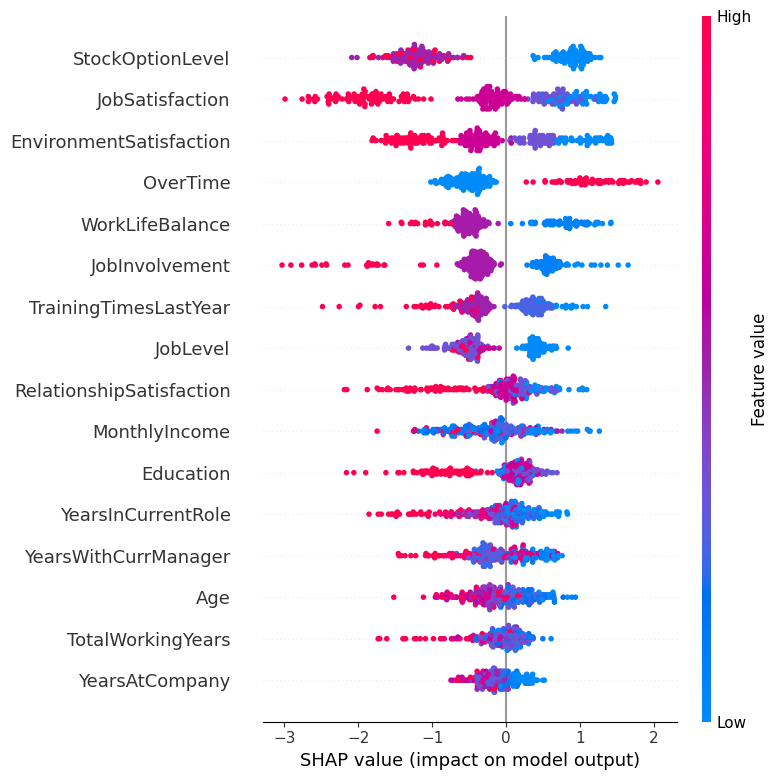

In [180]:
shap_analysis(best_model_cb,"CatBoost",x_test, X_test_inv)

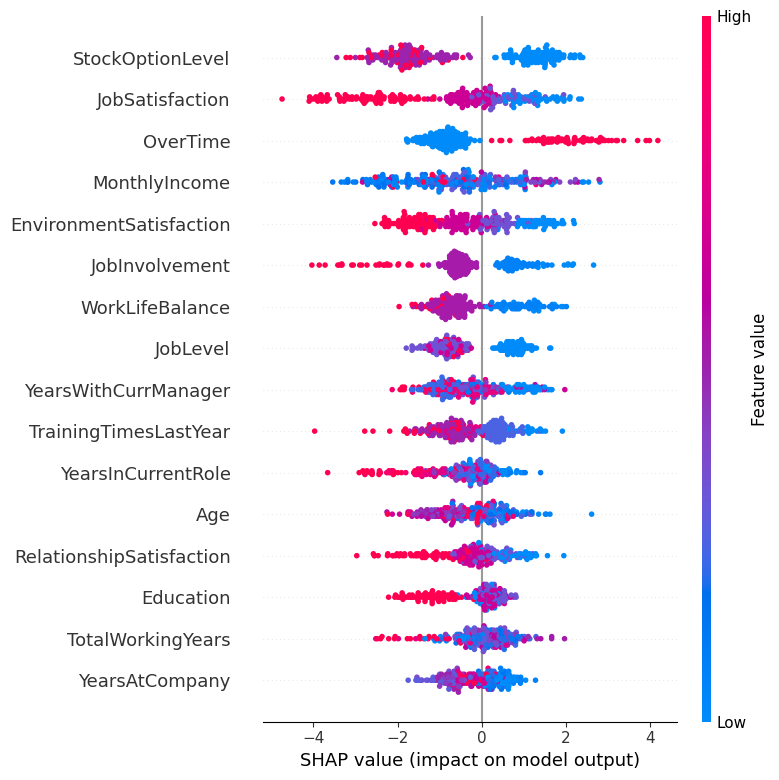

In [182]:
shap_analysis(best_model_xgb,"XGBoost", x_test,X_test_inv)